<a href="https://colab.research.google.com/github/Alexandre77777/neural_networks/blob/main/7.%20%D0%98%D1%81%D0%BF%D0%BE%D0%BB%D1%8C%D0%B7%D0%BE%D0%B2%D0%B0%D0%BD%D0%B8%D0%B5%20%D0%B0%D0%B2%D1%82%D0%BE%D1%8D%D0%BD%D0%BA%D0%BE%D0%B4%D0%B5%D1%80%D0%B0%20%D0%B4%D0%BB%D1%8F%20%D1%80%D0%B5%D1%88%D0%B5%D0%BD%D0%B8%D1%8F%20%D0%B7%D0%B0%D0%B4%D0%B0%D1%87%20%D1%81%D0%B5%D0%BC%D0%B0%D0%BD%D1%82%D0%B8%D1%87%D0%B5%D1%81%D0%BA%D0%BE%D0%B9%20%D1%81%D0%B5%D0%B3%D0%BC%D0%B5%D0%BD%D1%82%D0%B0%D1%86%D0%B8%D0%B8/%D0%9F%D1%80%D0%B0%D0%BA%D1%82%D0%B8%D1%87%D0%B5%D1%81%D0%BA%D0%B0%D1%8F_%D1%80%D0%B0%D0%B1%D0%BE%D1%82%D0%B0_%E2%84%967_%D0%98%D1%81%D0%BF%D0%BE%D0%BB%D1%8C%D0%B7%D0%BE%D0%B2%D0%B0%D0%BD%D0%B8%D0%B5_%D0%B0%D0%B2%D1%82%D0%BE%D1%8D%D0%BD%D0%BA%D0%BE%D0%B4%D0%B5%D1%80%D0%B0_%D0%B4%D0%BB%D1%8F_%D1%80%D0%B5%D1%88%D0%B5%D0%BD%D0%B8%D1%8F_%D0%B7%D0%B0%D0%B4%D0%B0%D1%87_%D1%81%D0%B5%D0%BC%D0%B0%D0%BD%D1%82%D0%B8%D1%87%D0%B5%D1%81%D0%BA%D0%BE%D0%B9_%D1%81%D0%B5%D0%B3%D0%BC%D0%B5%D0%BD%D1%82%D0%B0%D1%86%D0%B8%D0%B8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Практическая работа №7. Использование автоэнкодера для решения задач семантической сегментации**

### **Введение**

Данная практическая работа посвящена применению глубокого обучения для семантической сегментации спутниковых снимков. Вы освоите обработку аэрофотоснимков с помощью нейронной сети архитектуры U-Net для выделения различных типов земной поверхности: зданий, дорог, растительности и других элементов ландшафта  .

В ходе работы будут рассмотрены:

- Основные принципы семантической сегментации изображений  
- Архитектура нейронной сети U-Net и её особенности   
- Подготовка и предобработка геопространственных данных с использованием `tf.data`  
- Обучение модели семантической сегментации  
- Оценка качества с использованием специализированных метрик  
- Применение обученной модели для анализа полноразмерных снимков

---

### **Раздел 1. Теоретические основы**

#### **1.1. Семантическая сегментация в геоанализе**

Семантическая сегментация — процесс разделения изображения на семантически значимые области, где каждому пикселю присваивается метка класса В контексте геоанализа это позволяет автоматически выделять на спутниковых снимках здания, дороги, водные объекты, растительность и т.д.

#### **1.2. Архитектура U-Net**

U-Net — сверточная нейронная сеть, изначально разработанная для сегментации биомедицинских изображений, но успешно адаптированная для геоанализа  . Название происходит от U-образной формы архитектуры.

Основные компоненты:

1. **Энкодер (downsampling)** — последовательность свёрточных слоёв с max-pooling для извлечения признаков **Декодер (upsampling)** — восстановление пространственного разрешения  
3. **Skip-connections** — обходные соединения между уровнями энкодера и декодера для сохранения детализации

---

### **Раздел 2. Подготовка данных**

#### **2.1. Загрузка и первичное знакомство с данными**

Скачайте набор данных по ссылке и распакуйте в рабочую директорию:

**Ссылка на датасет:** https://landcover.ai.linuxpolska.com/#dataset (снимки и маски, Version 1)


---

#### **2.2. Установка необходимых библиотек**

In [ ]:
%%capture
!pip install -U -q segmentation-models

import os
os.kill(os.getpid(), 9)  # перезапуск среды после установки

После перезапуска импортируйте библиотеки:

In [ ]:
import os
import glob
import random
import numpy as np
import cv2

from PIL import Image
from matplotlib import pyplot as plt

import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import load_model

os.environ['SM_FRAMEWORK'] = 'tf.keras'
import segmentation_models as sm
from segmentation_models.losses import DiceLoss

from sklearn.metrics import confusion_matrix, cohen_kappa_score
import seaborn as sns

#### **2.3. Сбор путей к изображениям и маскам**

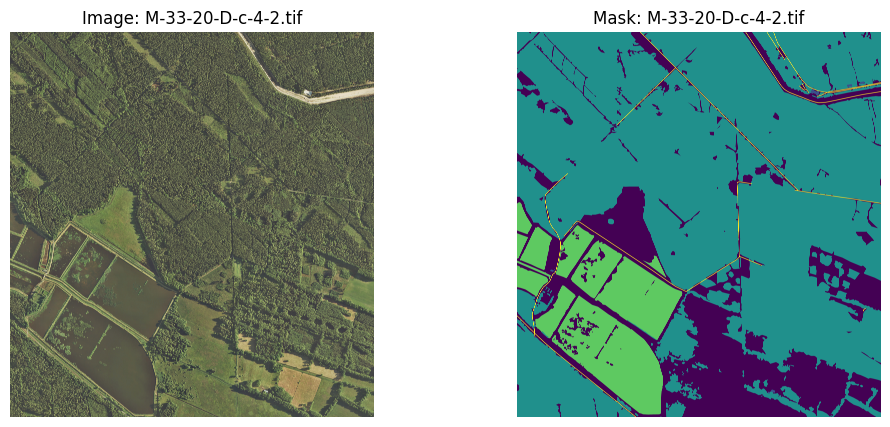

Image shape: (9636, 9095, 3)
Image dtype: uint8
Mask shape: (9636, 9095)
Mask dtype: uint8
Labels: [0 1 2 3 4]
Counts: [18008335    46512 59476087  9553859   554627]


In [ ]:
root_directory = r"./landcover.ai.v1"
img_dir = os.path.join(root_directory, "images")
mask_dir = os.path.join(root_directory, "masks")

image_name = sorted(os.listdir(img_dir))[0]
mask_name = sorted(os.listdir(mask_dir))[0]

with rasterio.open(os.path.join(img_dir, image_name)) as src:
    temp_img = src.read()
    temp_img = np.transpose(temp_img, (1, 2, 0))

with rasterio.open(os.path.join(mask_dir, mask_name)) as src:
    temp_mask = src.read(1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(temp_img)
plt.title(f"Image: {image_name}")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(temp_mask)
plt.title(f"Mask: {mask_name}")
plt.axis("off")
plt.show()

print("Image shape:", temp_img.shape)
print("Image dtype:", temp_img.dtype)
print("Mask shape:", temp_mask.shape)
print("Mask dtype:", temp_mask.dtype)

labels, count = np.unique(temp_mask, return_counts=True)
print("Labels:", labels)
print("Counts:", count)

### 2.4. Обрезка исходных растров на фрагменты (патчи) размером 256x256. Сохраните их в каталог на локальное хранилице

Image patches shape: (37, 35, 1, 256, 256, 3)


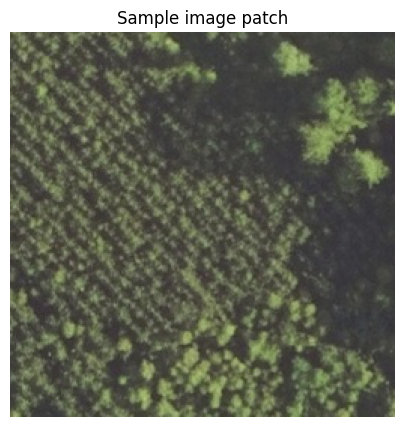

In [ ]:
from patchify import patchify

patch_size = 256

image_patches = patchify(temp_img, (patch_size, patch_size, 3), step=patch_size)
print("Image patches shape:", image_patches.shape)

# пример первого патча
sample_patch_img = image_patches[0, 0, 0]

plt.figure(figsize=(5, 5))
plt.imshow(sample_patch_img)
plt.title("Sample image patch")
plt.axis("off")
plt.show()

In [ ]:
import os
import cv2

image_patch_dir = "./landcover.ai.v1/image_patches"
os.makedirs(image_patch_dir, exist_ok=True)

for i in range(image_patches.shape[0]):
    for j in range(image_patches.shape[1]):
        patch = image_patches[i, j, 0]
        patch_name = f"{os.path.splitext(image_name)[0]}_{i}_{j}.png"
        patch_bgr = cv2.cvtColor(patch, cv2.COLOR_RGB2BGR)
        cv2.imwrite(os.path.join(image_patch_dir, patch_name), patch_bgr)

print("Saved image patches:", len(os.listdir(image_patch_dir)))

Saved image patches: 1295


### 2.5. Обрезка исходных масок на фрагменты (патчи) размером 256x256. Сохраните их в каталог на локальное хранилице

Mask patches shape: (37, 35, 256, 256)


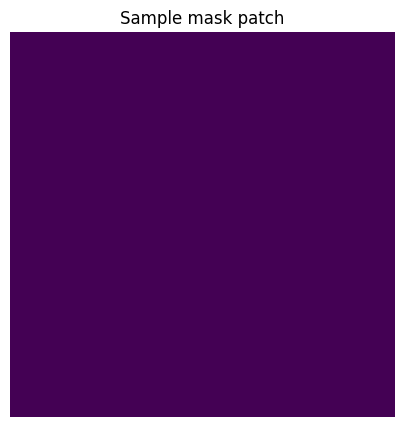

In [ ]:
mask_patches = patchify(temp_mask, (patch_size, patch_size), step=patch_size)
print("Mask patches shape:", mask_patches.shape)

sample_patch_mask = mask_patches[0, 0]

plt.figure(figsize=(5, 5))
plt.imshow(sample_patch_mask)
plt.title("Sample mask patch")
plt.axis("off")
plt.show()


In [ ]:
import os
import cv2

mask_patch_dir = "./landcover.ai.v1/mask_patches"
os.makedirs(mask_patch_dir, exist_ok=True)

for i in range(mask_patches.shape[0]):
    for j in range(mask_patches.shape[1]):
        patch = mask_patches[i, j]
        patch_name = f"{os.path.splitext(mask_name)[0]}_{i}_{j}.png"
        cv2.imwrite(os.path.join(mask_patch_dir, patch_name), patch)

print("Saved mask patches:", len(os.listdir(mask_patch_dir)))

Saved mask patches: 1295


### 2.6. Проверка патчей масок и исходного растра на соответствие

In [ ]:
import os

image_patch_dir = "./landcover.ai.v1/image_patches"
mask_patch_dir = "./landcover.ai.v1/mask_patches"

image_files = sorted(os.listdir(image_patch_dir))
mask_files = sorted(os.listdir(mask_patch_dir))

print("Images:", len(image_files))
print("Masks:", len(mask_files))
print("First image patch:", image_files[0])
print("First mask patch:", mask_files[0])
print("Names match:", image_files[0] == mask_files[0])
print("All names match:", image_files == mask_files)

Images: 1295
Masks: 1295
First image patch: M-33-20-D-c-4-2_0_0.png
First mask patch: M-33-20-D-c-4-2_0_0.png
Names match: True
All names match: True


### 2.7. Отсев неинформативных растров и соответствующих масок

In [ ]:
import os
import cv2
import numpy as np

image_patch_dir = "./landcover.ai.v1/image_patches"
mask_patch_dir = "./landcover.ai.v1/mask_patches"

filtered_image_dir = "./landcover.ai.v1/filtered_images"
filtered_mask_dir = "./landcover.ai.v1/filtered_masks"
os.makedirs(filtered_image_dir, exist_ok=True)
os.makedirs(filtered_mask_dir, exist_ok=True)

kept = 0
removed = 0

for fname in sorted(os.listdir(mask_patch_dir)):
    mask_path = os.path.join(mask_patch_dir, fname)
    img_path = os.path.join(image_patch_dir, fname)

    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    total_pixels = mask.size
    non_zero_pixels = np.count_nonzero(mask)

    if non_zero_pixels / total_pixels > 0.05:
        cv2.imwrite(os.path.join(filtered_mask_dir, fname), mask)
        img = cv2.imread(img_path)
        cv2.imwrite(os.path.join(filtered_image_dir, fname), img)
        kept += 1
    else:
        removed += 1

print("Kept:", kept)
print("Removed:", removed)

Kept: 1212
Removed: 83


### 2.8. Формирование папок с обучающей и валидационной выборкой

### Разделение данных по папкам на обучающую и проверочную выборку (после разделения снимка и маски на патчи)


Ниже представлен Код для разделения папки на train и val.
После создания новых папок переименуйте их и расположите в формате, приведенном ниже, для использования для семантической сегментации с помощью генераторов данных.

[Документация](https://pypi.org/project/split-folders/)

In [ ]:
import splitfolders

splitfolders.ratio(
    input="./landcover.ai.v1/input",
    output="./landcover.ai.v1/data",
    seed=42,
    ratio=(0.8, 0.2),
    group_prefix=None,
    move=False
)

Copying files: 2424 files [00:00, 7407.26 files/s]


In [ ]:
import os
import shutil

base = "./landcover.ai.v1"
wrong_data = os.path.join(base, "data")
input_dir = os.path.join(base, "input")
input_images = os.path.join(input_dir, "images")
input_masks = os.path.join(input_dir, "masks")

if os.path.exists(wrong_data):
    shutil.rmtree(wrong_data)
if os.path.exists(input_dir):
    shutil.rmtree(input_dir)

os.makedirs(input_images, exist_ok=True)
os.makedirs(input_masks, exist_ok=True)

src_images = os.path.join(base, "filtered_images")
src_masks = os.path.join(base, "filtered_masks")

for f in sorted(os.listdir(src_images)):
    shutil.copy(os.path.join(src_images, f), os.path.join(input_images, f))

for f in sorted(os.listdir(src_masks)):
    shutil.copy(os.path.join(src_masks, f), os.path.join(input_masks, f))

print("Input images:", len(os.listdir(input_images)))
print("Input masks:", len(os.listdir(input_masks)))

Input images: 1212
Input masks: 1212


## Раздел 3. Предобработка обучающей и валидационной выборки

### 3.1. Инициализация сформированной выборки

In [ ]:
import os

dataset_root = "./landcover.ai.v1/data"

train_img_dir = os.path.join(dataset_root, "train", "images")
train_mask_dir = os.path.join(dataset_root, "train", "masks")
val_img_dir = os.path.join(dataset_root, "val", "images")
val_mask_dir = os.path.join(dataset_root, "val", "masks")

print("Train images:", len(os.listdir(train_img_dir)))
print("Train masks:", len(os.listdir(train_mask_dir)))
print("Val images:", len(os.listdir(val_img_dir)))
print("Val masks:", len(os.listdir(val_mask_dir)))

Train images: 969
Train masks: 969
Val images: 243
Val masks: 243


### 3.2. Предобработка обучающей выборки

Обратите внимание на формат масок в датасете. Возможно для решения этой задачи нет необходимости изменять исходные значения пикселей в маске.

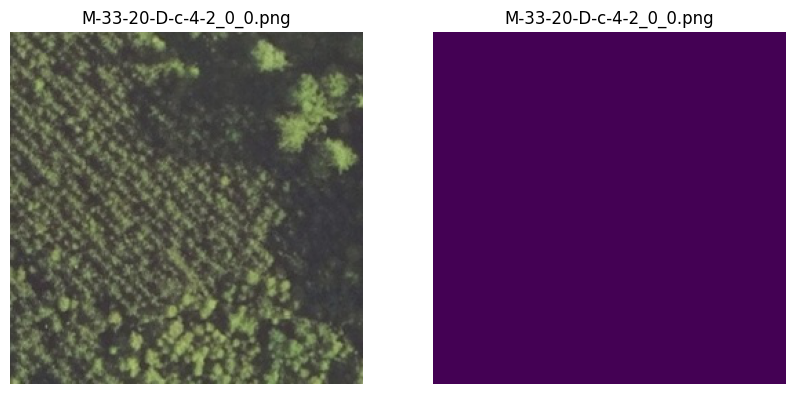

Image shape: (256, 256, 3)
Mask shape: (256, 256)
Mask labels: [2]


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

train_image_names = sorted(os.listdir(train_img_dir))
train_mask_names = sorted(os.listdir(train_mask_dir))

img = cv2.cvtColor(cv2.imread(os.path.join(train_img_dir, train_image_names[0])), cv2.COLOR_BGR2RGB)
mask = cv2.imread(os.path.join(train_mask_dir, train_mask_names[0]), cv2.IMREAD_GRAYSCALE)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title(train_image_names[0])
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(mask)
plt.title(train_mask_names[0])
plt.axis("off")
plt.show()

print("Image shape:", img.shape)
print("Mask shape:", mask.shape)
print("Mask labels:", np.unique(mask))

In [ ]:
import os
import cv2
import numpy as np

def load_dataset(image_dir, mask_dir):
    image_names = sorted(os.listdir(image_dir))
    mask_names = sorted(os.listdir(mask_dir))

    images = []
    masks = []

    for img_name, mask_name in zip(image_names, mask_names):
        img = cv2.cvtColor(cv2.imread(os.path.join(image_dir, img_name)), cv2.COLOR_BGR2RGB)
        mask = cv2.imread(os.path.join(mask_dir, mask_name), cv2.IMREAD_GRAYSCALE)

        images.append(img)
        masks.append(mask)

    return np.array(images), np.array(masks)

X_train, y_train = load_dataset(train_img_dir, train_mask_dir)
X_val, y_val = load_dataset(val_img_dir, val_mask_dir)

print("X_train:", X_train.shape, X_train.dtype)
print("y_train:", y_train.shape, y_train.dtype)
print("X_val:", X_val.shape, X_val.dtype)
print("y_val:", y_val.shape, y_val.dtype)
print("Train mask labels:", np.unique(y_train))

X_train: (969, 256, 256, 3) uint8
y_train: (969, 256, 256) uint8
X_val: (243, 256, 256, 3) uint8
y_val: (243, 256, 256) uint8
Train mask labels: [0 1 2 3 4]


### 3.3. Нормализация исходного патча и маски

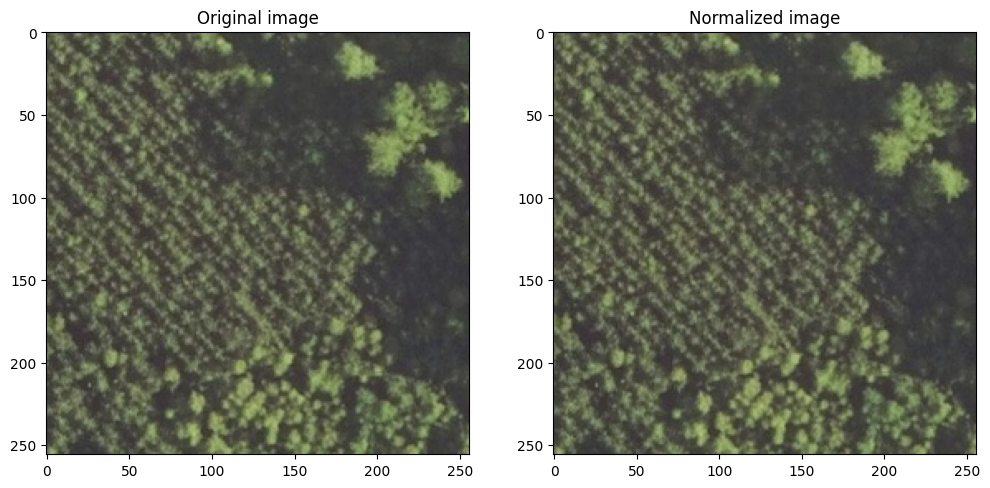

In [ ]:
X_train_norm = X_train / 255.0
X_val_norm = X_val / 255.0
image_number = 0

plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(X_train[image_number])
plt.title("Original image")

plt.subplot(122)
plt.imshow(X_train_norm[image_number])
plt.title("Normalized image")
plt.show()

In [ ]:
print(f"X_train count: {X_train.shape[0]}")
print(f"X_train shape: {X_train.shape}")
print(f"X_train dtype: {X_train.dtype}")
print(f"X_train min/max: {X_train.min()} / {X_train.max()}")

print(f"X_train_norm count: {X_train_norm.shape[0]}")
print(f"X_train_norm shape: {X_train_norm.shape}")
print(f"X_train_norm dtype: {X_train_norm.dtype}")
print(f"X_train_norm min/max: {X_train_norm.min()} / {X_train_norm.max()}")

X_train count: 969
X_train shape: (969, 256, 256, 3)
X_train dtype: uint8
X_train min/max: 8 / 255
X_train_norm count: 969
X_train_norm shape: (969, 256, 256, 3)
X_train_norm dtype: float64
X_train_norm min/max: 0.03137254901960784 / 1.0


### 3.4. Формирование последовательной загрузки набора данных с жесткого диска для обучения модели, используя Keras.ImageDataGenerator()

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

seed = 24
batch_size = 16
img_height = 256
img_width = 256
n_classes = 5

img_data_gen_args = dict(rescale=1./255)
mask_data_gen_args = dict()

image_datagen = ImageDataGenerator(**img_data_gen_args)
mask_datagen = ImageDataGenerator(**mask_data_gen_args)

image_generator = image_datagen.flow_from_directory(
    "./landcover.ai.v1/data/train",
    classes=["images"],
    class_mode=None,
    color_mode="rgb",
    target_size=(img_height, img_width),
    batch_size=batch_size,
    seed=seed
)

mask_generator = mask_datagen.flow_from_directory(
    "./landcover.ai.v1/data/train",
    classes=["masks"],
    class_mode=None,
    color_mode="grayscale",
    target_size=(img_height, img_width),
    batch_size=batch_size,
    seed=seed
)

val_image_generator = image_datagen.flow_from_directory(
    "./landcover.ai.v1/data/val",
    classes=["images"],
    class_mode=None,
    color_mode="rgb",
    target_size=(img_height, img_width),
    batch_size=batch_size,
    seed=seed
)

val_mask_generator = mask_datagen.flow_from_directory(
    "./landcover.ai.v1/data/val",
    classes=["masks"],
    class_mode=None,
    color_mode="grayscale",
    target_size=(img_height, img_width),
    batch_size=batch_size,
    seed=seed
)

train_generator = zip(image_generator, mask_generator)
val_generator = zip(val_image_generator, val_mask_generator)

Found 969 images belonging to 1 classes.
Found 969 images belonging to 1 classes.
Found 243 images belonging to 1 classes.
Found 243 images belonging to 1 classes.


#### 3.5. Визуализация данных

X batch shape: (16, 256, 256, 3)
Y batch shape: (16, 256, 256, 1)
X batch dtype: float32
Y batch dtype: float32
Y unique labels: [0. 2. 4.]


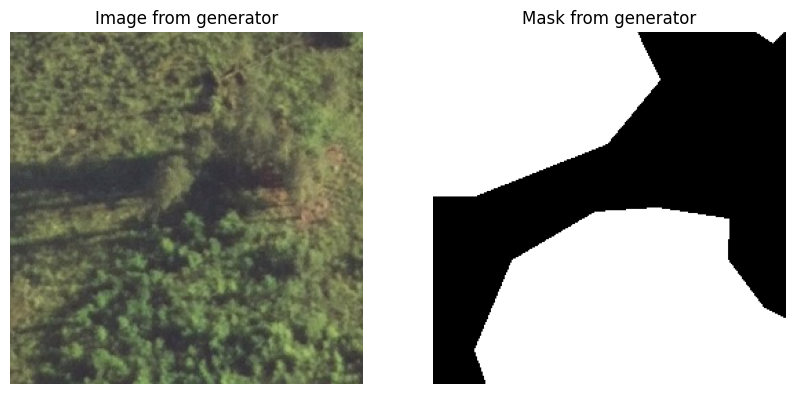

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

x_batch, y_batch = next(train_generator)

print("X batch shape:", x_batch.shape)
print("Y batch shape:", y_batch.shape)
print("X batch dtype:", x_batch.dtype)
print("Y batch dtype:", y_batch.dtype)
print("Y unique labels:", np.unique(y_batch))

image_number = 0

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(x_batch[image_number])
plt.title("Image from generator")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(y_batch[image_number].squeeze(), cmap="gray")
plt.title("Mask from generator")
plt.axis("off")
plt.show()

## Раздел 4. Разработка архитектуры и обучени модели.

* Изучите техническую докуентацию по работе с модулем [Segmentation Models](https://segmentation-models.readthedocs.io/en/latest/tutorial.html)

* Последовательно обучите несколько моделей, используя при этом разные [функции потерь ](https://segmentation-models.readthedocs.io/en/latest/api.html#losses)

> [Реализация всех имеющихся в модуле функций потерь на GIT разработчиков](https://github.com/qubvel/segmentation_models/blob/master/segmentation_models/losses.py)

* При обучении используйте несколько метрик [метрик](https://segmentation-models.readthedocs.io/en/latest/api.html#metrics), определив их в массиве.



Пример:

```
metrics = ['accuracy', sm.metrics.iou_score]

model.compile('Adam', loss=sm.losses.categorical_focal_jaccard_loss, metrics=metrics)
```
> [Реализация всех имеющихся в модуле метрик на GIT разработчиков](https://github.com/qubvel/segmentation_models/blob/master/segmentation_models/metrics.py)



### 4.1. Определение гиперпараметров обучения модели Resnet34

In [ ]:
n_classes = 5
BACKBONE = "resnet34"
BATCH_SIZE = batch_size
EPOCHS = 20

def multi_class_generator(generator, num_classes):
    while True:
        x, y = next(generator)
        x = x.astype(np.float32)
        y = y.squeeze(-1).astype(np.uint8)
        y = keras.utils.to_categorical(y, num_classes=num_classes).astype(np.float32)
        yield x, y

train_gen = multi_class_generator(train_generator, n_classes)
val_gen = multi_class_generator(val_generator, n_classes)

model = sm.Unet(
    BACKBONE,
    classes=n_classes,
    activation="softmax",
    encoder_weights=None,
    input_shape=(256, 256, 3)
)

metrics = ["accuracy", sm.metrics.iou_score]
model.compile(optimizer="Adam",
              loss=sm.losses.categorical_focal_jaccard_loss,
              metrics=metrics)

steps_per_epoch = math.ceil(969 / BATCH_SIZE)
validation_steps = math.ceil(243 / BATCH_SIZE)

### 4.2. Обучение модели Resnet34

In [ ]:
history = model.fit(
    train_gen,
    steps_per_epoch=steps_per_epoch,
    epochs=EPOCHS,
    validation_data=val_gen,
    validation_steps=validation_steps,
    verbose=1
)

E0000 00:00:1775052118.435762    8214 ptx_compiler_helpers.cc:154] *** WARNING *** Invoking ptxas with version 12.1.105, which corresponds to a CUDA version <=12.6.2. CUDA versions 12.x.y up to and including 12.6.2 miscompile certain edge cases around clamping.
Please upgrade to CUDA 12.6.3 or newer.


Epoch 1/20


I0000 00:00:1775052119.407975    7994 generator_dataset_op.cc:213] Memory patch applied: M_TRIM_THRESHOLD=128 kb was set.
I0000 00:00:1775052127.971906    8170 service.cc:153] XLA service 0x7faa1005d020 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1775052127.971941    8170 service.cc:161]   StreamExecutor [0]: NVIDIA H100 PCIe, Compute Capability 9.0a (Driver: 12.9.0; Runtime: 12.9.0; Toolkit: 12.5.0; DNN: 9.20.0)
I0000 00:00:1775052128.284958    8170 dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1775052130.159018    8170 cuda_dnn.cc:461] Loaded cuDNN version 92000


 1/61 ━━━━━━━━━━━━━━━━━━━━ 42:30 43s/step - accuracy: 0.1008 - iou_score: 0.0722 - loss: 0.9996

I0000 00:00:1775052161.760664    8170 subprocess_compilation.cc:348] ptxas warning : Registers are spilled to local memory in function 'fusion_1117', 492 bytes spill stores, 548 bytes spill loads

I0000 00:00:1775052161.834150    8170 device_compiler.h:208] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


60/61 ━━━━━━━━━━━━━━━━━━━━ 0s 550ms/step - accuracy: 0.6245 - iou_score: 0.2043 - loss: 0.8278

I0000 00:00:1775052194.229517    8167 subprocess_compilation.cc:348] ptxas warning : Registers are spilled to local memory in function 'fusion_1170', 492 bytes spill stores, 548 bytes spill loads



61/61 ━━━━━━━━━━━━━━━━━━━━ 85s 706ms/step - accuracy: 0.7843 - iou_score: 0.2902 - loss: 0.7325 - val_accuracy: 0.1711 - val_iou_score: 0.0515 - val_loss: 1.6146
Epoch 2/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - accuracy: 0.8736 - iou_score: 0.4045 - loss: 0.6191 - val_accuracy: 0.2940 - val_iou_score: 0.0722 - val_loss: 1.4114
Epoch 3/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - accuracy: 0.8906 - iou_score: 0.4284 - loss: 0.5923 - val_accuracy: 0.1397 - val_iou_score: 0.0397 - val_loss: 1.6372
Epoch 4/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - accuracy: 0.8914 - iou_score: 0.4460 - loss: 0.5785 - val_accuracy: 0.1691 - val_iou_score: 0.0774 - val_loss: 1.2600
Epoch 5/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - accuracy: 0.8939 - iou_score: 0.4490 - loss: 0.5741 - val_accuracy: 0.2028 - val_iou_score: 0.0874 - val_loss: 1.1648
Epoch 6/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - accuracy: 0.9085 - iou_score: 0.4768 - loss: 0.5438 - val_accuracy: 0.2140 - val_iou_score: 0.0873 - 

### 4.3. Компиляция и обучение модели FPN

In [ ]:
# FPN
train_gen = multi_class_generator(train_generator, n_classes)
val_gen = multi_class_generator(val_generator, n_classes)

fpn_model = sm.FPN(
    BACKBONE,
    classes=n_classes,
    activation="softmax",
    encoder_weights=None,
    input_shape=(256, 256, 3)
)

fpn_model.compile(
    optimizer="Adam",
    loss=sm.losses.categorical_focal_jaccard_loss,
    metrics=metrics
)

fpn_history = fpn_model.fit(
    train_gen,
    steps_per_epoch=steps_per_epoch,
    epochs=EPOCHS,
    validation_data=val_gen,
    validation_steps=validation_steps,
    verbose=1
)

Epoch 1/20


I0000 00:00:1775063350.977489   18545 generator_dataset_op.cc:213] Memory patch applied: M_TRIM_THRESHOLD=128 kb was set.
I0000 00:00:1775063360.061614   18654 service.cc:153] XLA service 0x7f190004f420 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1775063360.061644   18654 service.cc:161]   StreamExecutor [0]: NVIDIA H100 PCIe, Compute Capability 9.0a (Driver: 12.9.0; Runtime: 12.9.0; Toolkit: 12.5.0; DNN: 9.20.0)
I0000 00:00:1775063360.432790   18654 dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1775063362.386496   18654 cuda_dnn.cc:461] Loaded cuDNN version 92000


 1/61 ━━━━━━━━━━━━━━━━━━━━ 53:12 53s/step - accuracy: 0.3076 - iou_score: 0.0720 - loss: 0.9803

I0000 00:00:1775063404.001233   18654 subprocess_compilation.cc:348] ptxas warning : Registers are spilled to local memory in function 'fusion_1118', 492 bytes spill stores, 548 bytes spill loads

I0000 00:00:1775063404.086004   18654 device_compiler.h:208] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


58/61 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.7634 - iou_score: 0.2908 - loss: 0.7481

E0000 00:00:1775063412.737993   18655 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1775063413.737563   18655 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1775063418.637994   18655 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


59/61 ━━━━━━━━━━━━━━━━━━━━ 1s 713ms/step - accuracy: 0.7645 - iou_score: 0.2918 - loss: 0.7469

I0000 00:00:1775063445.373206   18655 subprocess_compilation.cc:348] ptxas warning : Registers are spilled to local memory in function 'fusion_1167', 492 bytes spill stores, 548 bytes spill loads



61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 691ms/step - accuracy: 0.7667 - iou_score: 0.2937 - loss: 0.7448

E0000 00:00:1775063451.332731   18652 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1775063452.518412   18652 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1775063453.262882   18652 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


61/61 ━━━━━━━━━━━━━━━━━━━━ 107s 899ms/step - accuracy: 0.8311 - iou_score: 0.3496 - loss: 0.6823 - val_accuracy: 0.1369 - val_iou_score: 0.2109 - val_loss: 1.4980
Epoch 2/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - accuracy: 0.8740 - iou_score: 0.4233 - loss: 0.6043 - val_accuracy: 0.0151 - val_iou_score: 0.0104 - val_loss: 1.7829
Epoch 3/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.8846 - iou_score: 0.4470 - loss: 0.5804 - val_accuracy: 0.1812 - val_iou_score: 0.0896 - val_loss: 1.5703
Epoch 4/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - accuracy: 0.8845 - iou_score: 0.4386 - loss: 0.5882 - val_accuracy: 0.1686 - val_iou_score: 0.0747 - val_loss: 1.5485
Epoch 5/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - accuracy: 0.8927 - iou_score: 0.4368 - loss: 0.5905 - val_accuracy: 0.1721 - val_iou_score: 0.0602 - val_loss: 1.2894
Epoch 6/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - accuracy: 0.8989 - iou_score: 0.4782 - loss: 0.5438 - val_accuracy: 0.1873 - val_iou_score: 0.0735 -

### 4.4. Компиляция и обучение модели Linknet

In [ ]:
# Linknet
train_gen = multi_class_generator(train_generator, n_classes)
val_gen = multi_class_generator(val_generator, n_classes)

linknet_model = sm.Linknet(
    BACKBONE,
    classes=n_classes,
    activation="softmax",
    encoder_weights=None,
    input_shape=(256, 256, 3)
)

linknet_model.compile(
    optimizer="Adam",
    loss=sm.losses.categorical_focal_jaccard_loss,
    metrics=metrics
)

linknet_history = linknet_model.fit(
    train_gen,
    steps_per_epoch=steps_per_epoch,
    epochs=EPOCHS,
    validation_data=val_gen,
    validation_steps=validation_steps,
    verbose=1
)

Epoch 1/20
 1/61 ━━━━━━━━━━━━━━━━━━━━ 36:58 37s/step - accuracy: 0.2274 - iou_score: 0.0638 - loss: 1.0027

I0000 00:00:1775063590.220588   18654 subprocess_compilation.cc:348] ptxas warning : Registers are spilled to local memory in function 'fusion_1202', 492 bytes spill stores, 548 bytes spill loads



44/61 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6070 - iou_score: 0.1690 - loss: 0.8658

I0000 00:00:1775063618.636653   18654 subprocess_compilation.cc:348] ptxas warning : Registers are spilled to local memory in function 'fusion_1251', 492 bytes spill stores, 548 bytes spill loads



61/61 ━━━━━━━━━━━━━━━━━━━━ 75s 631ms/step - accuracy: 0.7805 - iou_score: 0.2723 - loss: 0.7515 - val_accuracy: 0.1326 - val_iou_score: 0.0380 - val_loss: 1.6699
Epoch 2/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - accuracy: 0.8778 - iou_score: 0.4004 - loss: 0.6218 - val_accuracy: 0.1428 - val_iou_score: 0.0696 - val_loss: 1.6332
Epoch 3/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - accuracy: 0.8955 - iou_score: 0.4337 - loss: 0.5878 - val_accuracy: 0.1309 - val_iou_score: 0.0376 - val_loss: 1.6638
Epoch 4/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - accuracy: 0.8941 - iou_score: 0.4310 - loss: 0.5909 - val_accuracy: 0.1432 - val_iou_score: 0.0427 - val_loss: 1.6283
Epoch 5/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - accuracy: 0.9026 - iou_score: 0.4526 - loss: 0.5696 - val_accuracy: 0.2005 - val_iou_score: 0.0824 - val_loss: 1.2718
Epoch 6/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.9042 - iou_score: 0.4785 - loss: 0.5432 - val_accuracy: 0.1464 - val_iou_score: 0.0435 - 

## Раздел 5. Визуализация процесса обучения. Оценка точности

### 5.1. Визуализация результатов обучения Resnet34

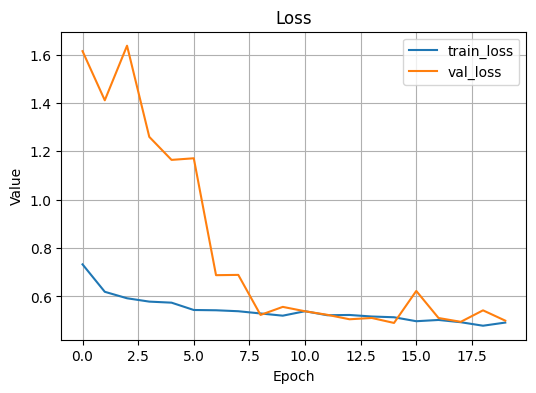

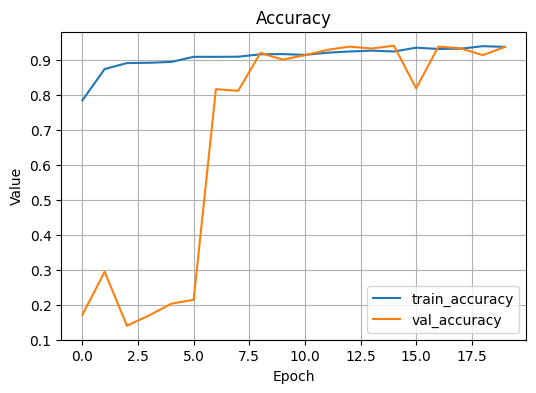

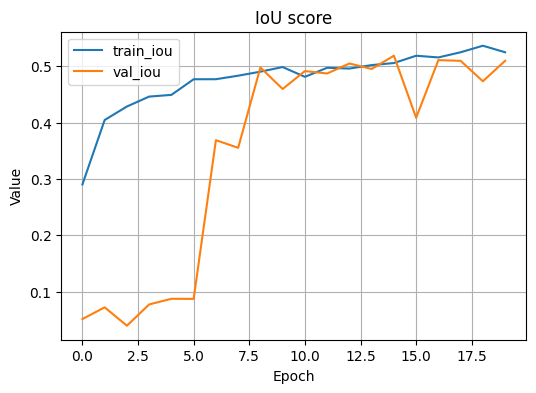

In [ ]:
import matplotlib.pyplot as plt

hist = history.history

plt.figure(figsize=(6, 4))
plt.plot(hist["loss"], label="train_loss")
plt.plot(hist["val_loss"], label="val_loss")
plt.title("Loss")
plt.xlabel("Epoch")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(6, 4))
plt.plot(hist["accuracy"], label="train_accuracy")
plt.plot(hist["val_accuracy"], label="val_accuracy")
plt.title("Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(6, 4))
plt.plot(hist["iou_score"], label="train_iou")
plt.plot(hist["val_iou_score"], label="val_iou")
plt.title("IoU score")
plt.xlabel("Epoch")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show()

### 5.2. Визуализация результатов обучения Linknet

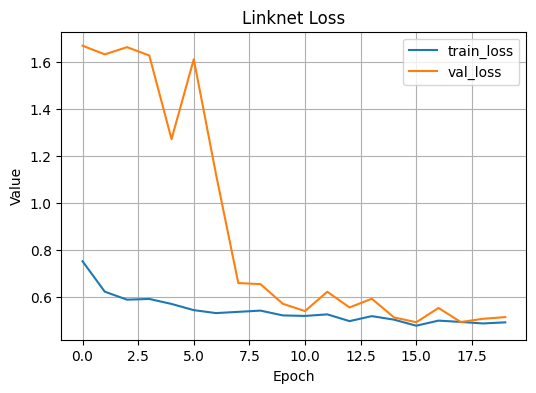

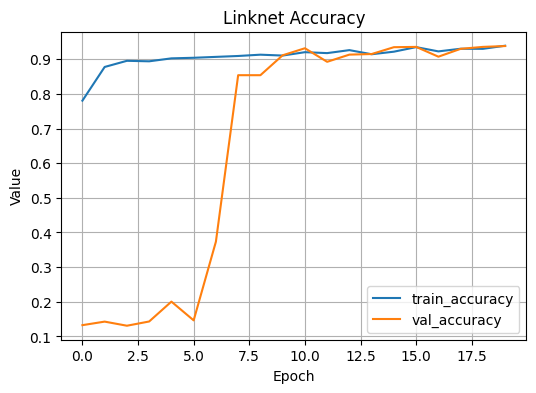

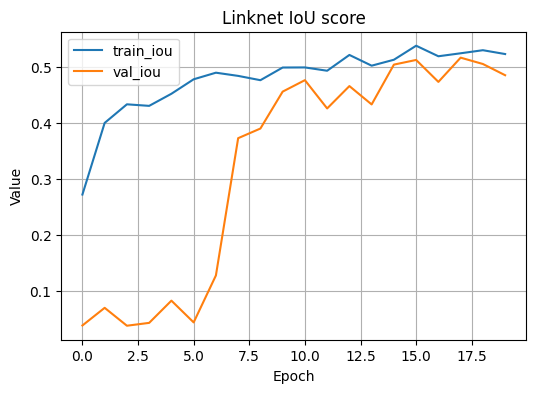

In [ ]:
# Linknet
hist = linknet_history.history

plt.figure(figsize=(6, 4))
plt.plot(hist["loss"], label="train_loss")
plt.plot(hist["val_loss"], label="val_loss")
plt.title("Linknet Loss")
plt.xlabel("Epoch")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(6, 4))
plt.plot(hist["accuracy"], label="train_accuracy")
plt.plot(hist["val_accuracy"], label="val_accuracy")
plt.title("Linknet Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(6, 4))
plt.plot(hist["iou_score"], label="train_iou")
plt.plot(hist["val_iou_score"], label="val_iou")
plt.title("Linknet IoU score")
plt.xlabel("Epoch")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show()

### 5.3. Визуализация результатов обучения FPN

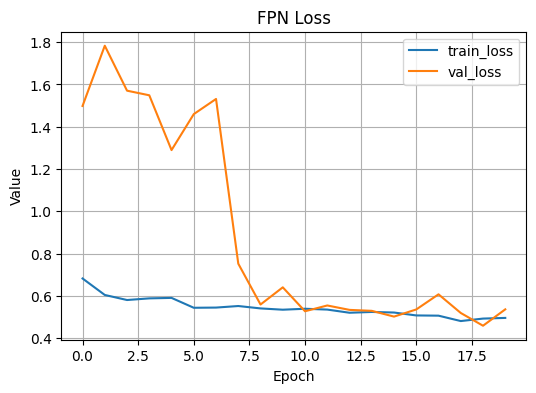

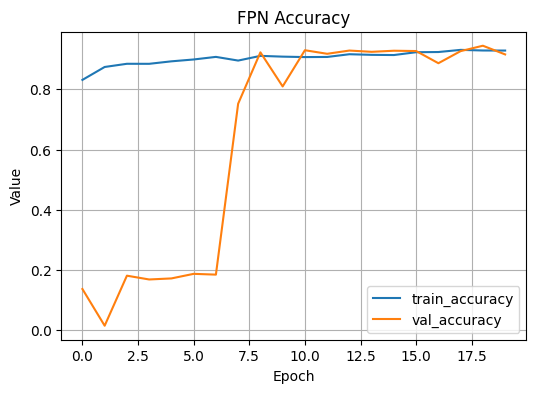

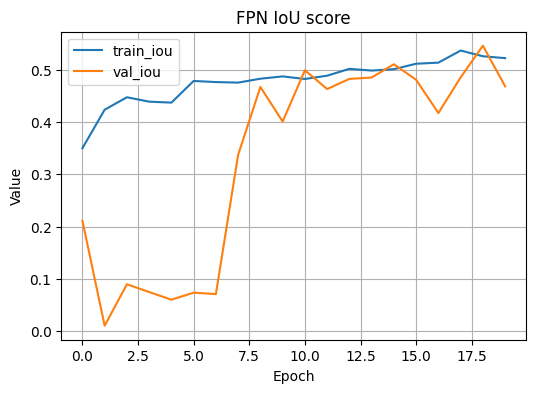

In [ ]:
# FPN
hist = fpn_history.history

plt.figure(figsize=(6, 4))
plt.plot(hist["loss"], label="train_loss")
plt.plot(hist["val_loss"], label="val_loss")
plt.title("FPN Loss")
plt.xlabel("Epoch")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(6, 4))
plt.plot(hist["accuracy"], label="train_accuracy")
plt.plot(hist["val_accuracy"], label="val_accuracy")
plt.title("FPN Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(6, 4))
plt.plot(hist["iou_score"], label="train_iou")
plt.plot(hist["val_iou_score"], label="val_iou")
plt.title("FPN IoU score")
plt.xlabel("Epoch")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show()

### 5.4. Оценка точности по валидационной выборке Resnet34

In [ ]:
class_names = ["background", "building", "woodland", "water", "road"]

In [ ]:
from tensorflow import keras
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import pandas as pd

y_val_cat = keras.utils.to_categorical(y_val, num_classes=n_classes).astype(np.float32)

val_loss, val_acc, val_iou = model.evaluate(X_val_norm, y_val_cat, verbose=1)
print(f"Val loss: {val_loss:.4f}")
print(f"Val accuracy: {val_acc:.4f}")
print(f"Val IoU: {val_iou:.4f}")

y_pred = model.predict(X_val_norm, verbose=1)
y_pred_labels = np.argmax(y_pred, axis=-1).reshape(-1)
y_true_labels = y_val.reshape(-1)

print("\nClassification report:")
print(classification_report(y_true_labels, y_pred_labels, target_names=class_names, digits=4))

cm = confusion_matrix(y_true_labels, y_pred_labels)
cm_df = pd.DataFrame(cm, index=class_names, columns=class_names)
print("\nConfusion matrix:")
display(cm_df)

8/8 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - accuracy: 0.9330 - iou_score: 0.4197 - loss: 0.5950
Val loss: 0.5950
Val accuracy: 0.9330
Val IoU: 0.4197
8/8 ━━━━━━━━━━━━━━━━━━━━ 4s 277ms/step

Classification report:


/workspace/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/workspace/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/workspace/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


              precision    recall  f1-score   support

  background     0.8362    0.6592    0.7372   2126691
    building     0.0000    0.0000    0.0000      8606
    woodland     0.9503    0.9864    0.9680  11591438
       water     0.9587    0.9486    0.9536   2087533
        road     0.2765    0.3742    0.3180    110980

    accuracy                         0.9330  15925248
   macro avg     0.6043    0.5937    0.5954  15925248
weighted avg     0.9309    0.9330    0.9303  15925248


Confusion matrix:


,background,building,woodland,water,road
background,1401888,0,553873,84690,86240
building,2449,0,2707,0,3450
woodland,137400,0,11434361,692,18985
water,106377,0,889,1980267,0
road,28351,0,41103,0,41526


### 5.5. Оценка точности по валидационной выборке FPN

In [ ]:
# FPN
y_val_cat = keras.utils.to_categorical(y_val, num_classes=n_classes).astype(np.float32)

val_loss, val_acc, val_iou = fpn_model.evaluate(X_val_norm, y_val_cat, verbose=1)
print(f"FPN Val loss: {val_loss:.4f}")
print(f"FPN Val accuracy: {val_acc:.4f}")
print(f"FPN Val IoU: {val_iou:.4f}")

y_pred = fpn_model.predict(X_val_norm, verbose=1)
y_pred_labels = np.argmax(y_pred, axis=-1).reshape(-1)
y_true_labels = y_val.reshape(-1)

print("\nFPN Classification report:")
print(classification_report(y_true_labels, y_pred_labels, target_names=class_names, digits=4))

cm = confusion_matrix(y_true_labels, y_pred_labels)
cm_df = pd.DataFrame(cm, index=class_names, columns=class_names)
print("\nFPN Confusion matrix:")
display(cm_df)

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.9107 - iou_score: 0.3980 - loss: 0.6151
FPN Val loss: 0.6151
FPN Val accuracy: 0.9107
FPN Val IoU: 0.3980
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

FPN Classification report:


/workspace/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/workspace/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/workspace/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


              precision    recall  f1-score   support

  background     0.7433    0.8055    0.7731   2126691
    building     0.0000    0.0000    0.0000      8606
    woodland     0.9341    0.9699    0.9516  11591438
       water     0.9865    0.7290    0.8385   2087533
        road     0.6075    0.2307    0.3344    110980

    accuracy                         0.9107  15925248
   macro avg     0.6543    0.5470    0.5795  15925248
weighted avg     0.9127    0.9107    0.9082  15925248


FPN Confusion matrix:


,background,building,woodland,water,road
background,1712983,0,386462,20509,6737
building,2566,0,4267,0,1773
woodland,340735,0,11242406,278,8019
water,196151,0,369468,1521900,14
road,52078,0,33297,0,25605


### 5.6. Оценка точности по валидационной выборке Linknet

In [ ]:
# Linknet
y_val_cat = keras.utils.to_categorical(y_val, num_classes=n_classes).astype(np.float32)

val_loss, val_acc, val_iou = linknet_model.evaluate(X_val_norm, y_val_cat, verbose=1)
print(f"Linknet Val loss: {val_loss:.4f}")
print(f"Linknet Val accuracy: {val_acc:.4f}")
print(f"Linknet Val IoU: {val_iou:.4f}")

y_pred = linknet_model.predict(X_val_norm, verbose=1)
y_pred_labels = np.argmax(y_pred, axis=-1).reshape(-1)
y_true_labels = y_val.reshape(-1)

print("\nLinknet Classification report:")
print(classification_report(y_true_labels, y_pred_labels, target_names=class_names, digits=4))

cm = confusion_matrix(y_true_labels, y_pred_labels)
cm_df = pd.DataFrame(cm, index=class_names, columns=class_names)
print("\nLinknet Confusion matrix:")
display(cm_df)

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.9358 - iou_score: 0.4314 - loss: 0.5735
Linknet Val loss: 0.5735
Linknet Val accuracy: 0.9358
Linknet Val IoU: 0.4314
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step

Linknet Classification report:


/workspace/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/workspace/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/workspace/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


              precision    recall  f1-score   support

  background     0.8321    0.6942    0.7569   2126691
    building     0.0000    0.0000    0.0000      8606
    woodland     0.9492    0.9872    0.9678  11591438
       water     0.9870    0.9261    0.9556   2087533
        road     0.3670    0.4539    0.4058    110980

    accuracy                         0.9358  15925248
   macro avg     0.6271    0.6123    0.6172  15925248
weighted avg     0.9340    0.9358    0.9336  15925248


Linknet Confusion matrix:


,background,building,woodland,water,road
background,1476341,0,542925,23818,83607
building,1255,0,4279,0,3072
woodland,146744,0,11442769,1724,201
water,135038,0,19135,1933360,0
road,14846,0,45762,0,50372


### 5.7. Визуализация предсказаний Resnet34 и сравнение их с оригинальными масками

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

class_names = ["background", "building", "woodland", "water", "road"]
target_classes = [1, 3, 4]  # building, water, road
cmap = ListedColormap(["black", "red", "green", "blue", "yellow"])

Найденные индексы: {'building': 152, 'water': 87, 'road': 4}

Класс: building
Index: 152, true classes: [0 1 2 4], pred classes: [0 2 3 4]


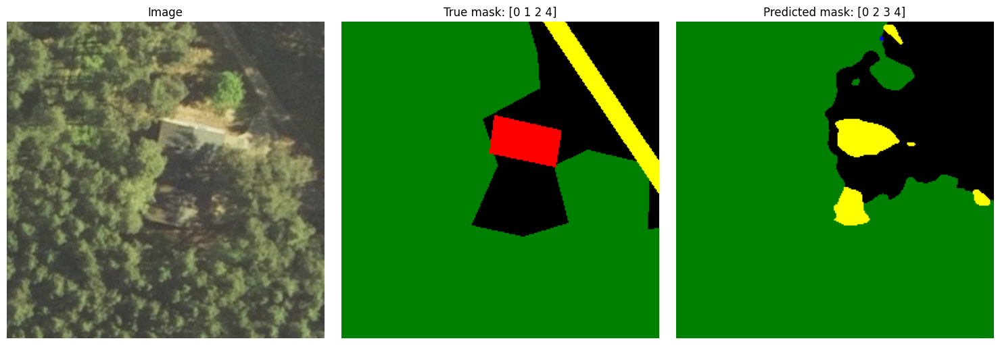


Класс: water
Index: 87, true classes: [0 3], pred classes: [0 2 3]


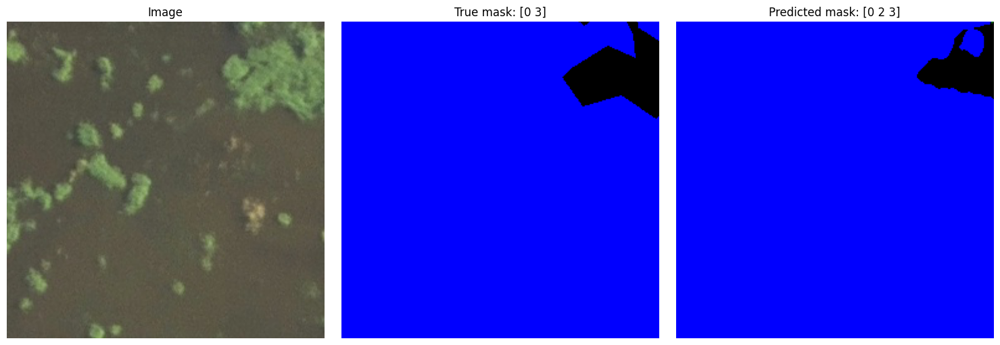


Класс: road
Index: 4, true classes: [0 2 4], pred classes: [0 2 4]


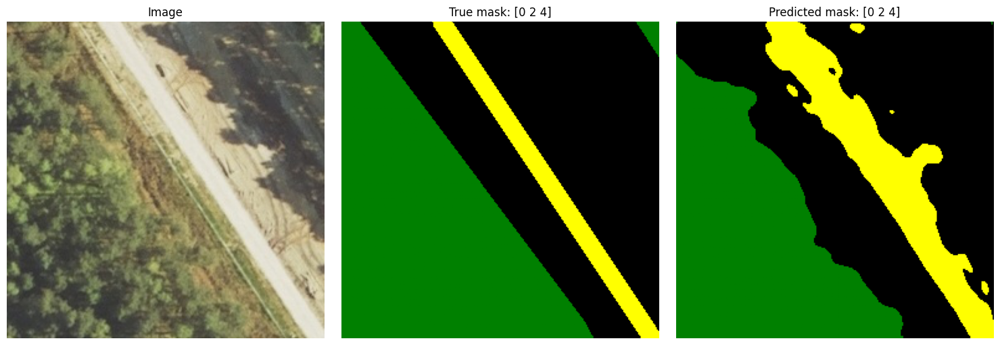

In [ ]:
found_examples = {}

for cls in target_classes:
    for i in range(len(y_val)):
        uniq = np.unique(y_val[i])
        if cls in uniq:
            found_examples[cls] = i
            break

print("Найденные индексы:", {class_names[k]: v for k, v in found_examples.items()})

for cls in target_classes:
    if cls not in found_examples:
        print(f"Класс {class_names[cls]} не найден в y_val")
        continue

    idx = found_examples[cls]
    img = X_val[idx]
    true_mask = y_val[idx]
    pred_mask = np.argmax(model.predict(X_val_norm[idx:idx+1], verbose=0), axis=-1)[0]

    print(f"\nКласс: {class_names[cls]}")
    print(f"Index: {idx}, true classes: {np.unique(true_mask)}, pred classes: {np.unique(pred_mask)}")

    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title("Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(true_mask, cmap=cmap, vmin=0, vmax=n_classes-1)
    plt.title(f"True mask: {np.unique(true_mask)}")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask, cmap=cmap, vmin=0, vmax=n_classes-1)
    plt.title(f"Predicted mask: {np.unique(pred_mask)}")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

### 5.8. Визуализация предсказаний FPN и сравнение их с оригинальными масками

FPN — найденные индексы: {'building': 152, 'water': 87, 'road': 4}


E0000 00:00:1775064059.470814   18654 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1775064061.681662   18654 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.



FPN | Класс: building
Index: 152, true classes: [0 1 2 4], pred classes: [0 2 4]


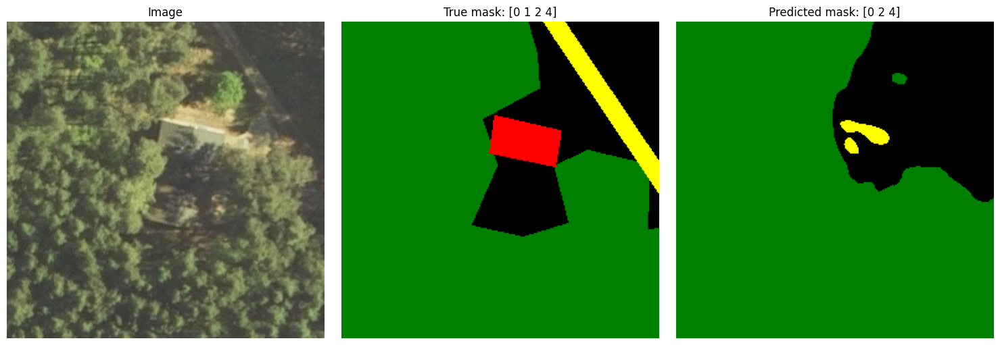


FPN | Класс: water
Index: 87, true classes: [0 3], pred classes: [0 2 3]


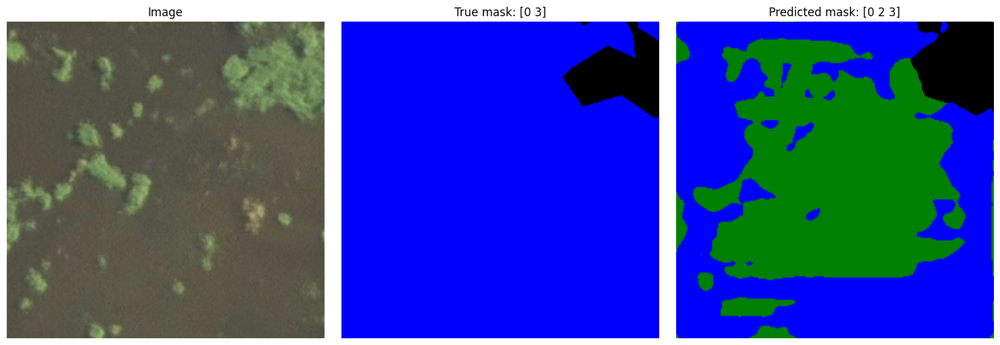


FPN | Класс: road
Index: 4, true classes: [0 2 4], pred classes: [0 2 4]


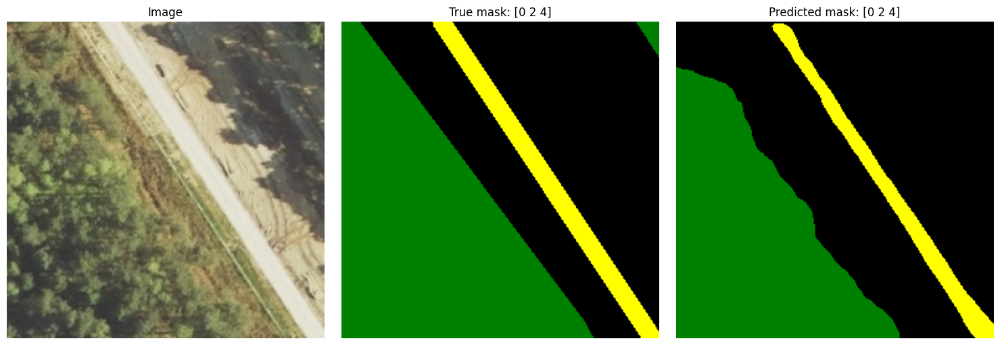

In [ ]:
found_examples = {}

for cls in target_classes:
    for i in range(len(y_val)):
        uniq = np.unique(y_val[i])
        if cls in uniq:
            found_examples[cls] = i
            break

print("FPN — найденные индексы:", {class_names[k]: v for k, v in found_examples.items()})

for cls in target_classes:
    if cls not in found_examples:
        print(f"Класс {class_names[cls]} не найден в y_val")
        continue

    idx = found_examples[cls]
    img = X_val[idx]
    true_mask = y_val[idx]
    pred_mask = np.argmax(fpn_model.predict(X_val_norm[idx:idx+1], verbose=0), axis=-1)[0]

    print(f"\nFPN | Класс: {class_names[cls]}")
    print(f"Index: {idx}, true classes: {np.unique(true_mask)}, pred classes: {np.unique(pred_mask)}")

    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title("Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(true_mask, cmap=cmap, vmin=0, vmax=n_classes-1)
    plt.title(f"True mask: {np.unique(true_mask)}")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask, cmap=cmap, vmin=0, vmax=n_classes-1)
    plt.title(f"Predicted mask: {np.unique(pred_mask)}")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

### 5.9. Визуализация предсказаний Linknet и сравнение их с оригинальными масками

Linknet — найденные индексы: {'building': 152, 'water': 87, 'road': 4}

Linknet | Класс: building
Index: 152, true classes: [0 1 2 4], pred classes: [0 2 4]


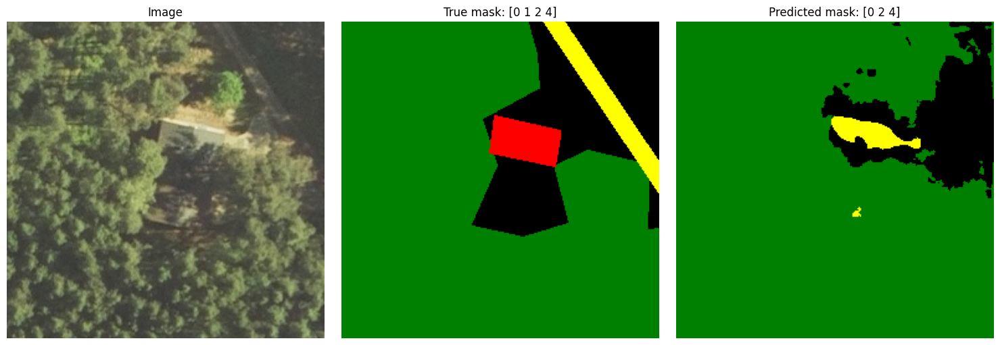


Linknet | Класс: water
Index: 87, true classes: [0 3], pred classes: [0 2 3]


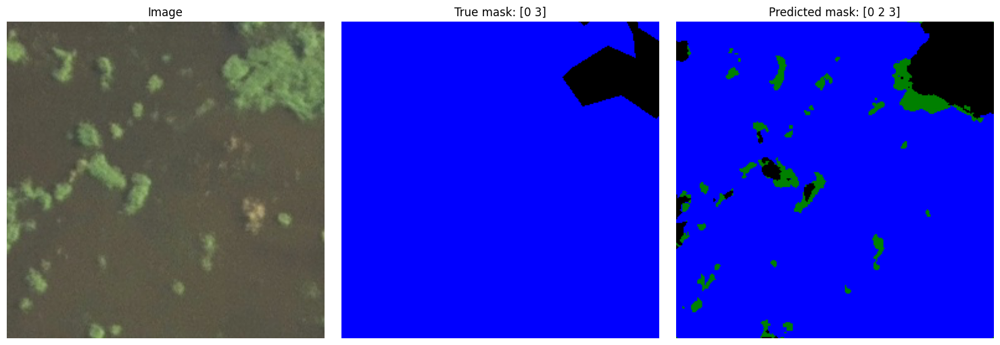


Linknet | Класс: road
Index: 4, true classes: [0 2 4], pred classes: [0 2 4]


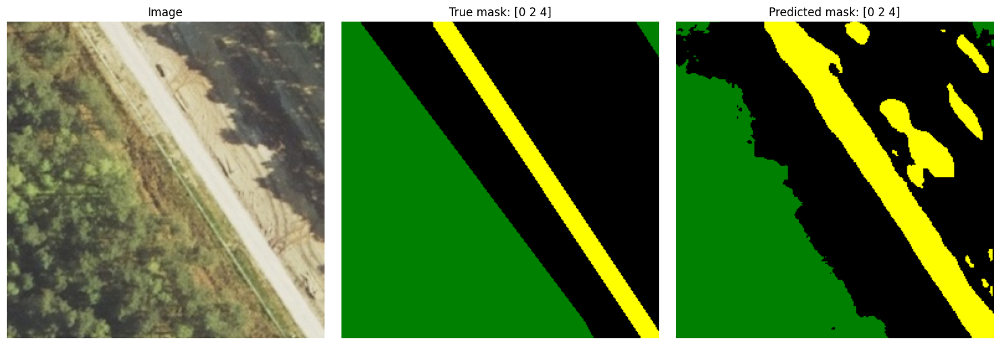

In [ ]:
found_examples = {}

for cls in target_classes:
    for i in range(len(y_val)):
        uniq = np.unique(y_val[i])
        if cls in uniq:
            found_examples[cls] = i
            break

print("Linknet — найденные индексы:", {class_names[k]: v for k, v in found_examples.items()})

for cls in target_classes:
    if cls not in found_examples:
        print(f"Класс {class_names[cls]} не найден в y_val")
        continue

    idx = found_examples[cls]
    img = X_val[idx]
    true_mask = y_val[idx]
    pred_mask = np.argmax(linknet_model.predict(X_val_norm[idx:idx+1], verbose=0), axis=-1)[0]

    print(f"\nLinknet | Класс: {class_names[cls]}")
    print(f"Index: {idx}, true classes: {np.unique(true_mask)}, pred classes: {np.unique(pred_mask)}")

    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title("Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(true_mask, cmap=cmap, vmin=0, vmax=n_classes-1)
    plt.title(f"True mask: {np.unique(true_mask)}")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask, cmap=cmap, vmin=0, vmax=n_classes-1)
    plt.title(f"Predicted mask: {np.unique(pred_mask)}")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

In [ ]:
model.save("unet_model.keras")
fpn_model.save("fpn_model.keras")
linknet_model.save("linknet_model.keras")
print("Все 3 модели сохранены")

Все 3 модели сохранены


In [ ]:
model.save_weights("unet_weights.weights.h5")
fpn_model.save_weights("fpn_weights.weights.h5")
linknet_model.save_weights("linknet_weights.weights.h5")
print("Веса всех 3 моделей сохранены")

Веса всех 3 моделей сохранены


# Задание №2. Создание и обучение модели семантической сегментации для классификации спутниковых снимков

## Пример создания модели с Unet-подобной архитектурой

In [ ]:
from tensorflow.keras import Model, Input
from keras.layers import Conv2D, MaxPooling2D, concatenate, UpSampling2D, Dropout, Cropping2D, Softmax, Conv2DTranspose
from keras.preprocessing import image
from keras.utils.vis_utils import plot_model

In [ ]:
def mini_u_net(image_shape, num_of_classes):

  input_image = Input(image_shape)

  # Encoder

  conv1_1 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv1_1')(input_image)
  conv1_2 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv1_2')(conv1_1)

  pool_1 = MaxPooling2D(name = 'pool_1')(conv1_2)

  conv2_1 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2_1')(pool_1)
  conv2_2 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2_2')(conv2_1)

  pool_2 = MaxPooling2D(name = 'pool_2')(conv2_2)

  conv3_1 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv3_1')(pool_2)
  conv3_2 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv3_2')(conv3_1)

  pool_3 = MaxPooling2D(name = 'pool_3')(conv3_2)

  conv4_1 = Conv2D(filters = 256, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv4_1')(pool_3)
  conv4_2 = Conv2D(filters = 256, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv4_2')(conv4_1)



  # Decoder

  upconv5_1 = UpSampling2D(name = 'upconv5_1')(conv4_2)
  upconv5_2 = Conv2D(filters = 128, kernel_size = (2, 2), activation = 'relu', padding = 'same', name = 'upconv5_2')(upconv5_1)
  concat_5 = concatenate([upconv5_2, conv3_2], axis = 3, name = 'concat_5') # Split Connections

  conv5_1 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv5_1')(concat_5)
  conv5_2 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv5_2')(conv5_1)


  upconv6_1 = UpSampling2D(name = 'upconv6_1')(conv5_2)
  upconv6_2 = Conv2D(filters = 64, kernel_size = (2, 2), activation = 'relu', padding = 'same', name = 'upconv6_2')(upconv6_1)
  concat_6 = concatenate([upconv6_2, conv2_2], axis = 3, name = 'concat_6') # Split Connections

  conv6_1 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv6_1')(concat_6)
  conv6_2 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv6_2')(conv6_1)

  upconv7_1 = UpSampling2D(name = 'upconv7_1')(conv6_2)
  upconv7_2 = Conv2D(filters = 32, kernel_size = (2, 2), activation = 'relu', padding = 'same', name = 'upconv7_2')(upconv7_1)
  concat_7 = concatenate([upconv7_2, conv1_2], axis = 3, name = 'concat_7') # Split Connections

  conv7_1 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv7_1')(concat_7)
  conv7_2 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv7_2')(conv7_1)

  conv8 = Conv2D(filters = num_of_classes, kernel_size = (1, 1), activation = 'softmax', name = 'conv8')(conv7_2)

  model = Model(inputs = input_image, outputs = conv8, name = 'model')

  return model

In [ ]:
unet_model = mini_u_net(image_shape = [256, 256, 3], num_of_classes = 6)

### Описание и визуализация архитектуры созданной модели

In [ ]:
unet_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_1 (Conv2D)               (None, 256, 256, 32  896         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv1_2 (Conv2D)               (None, 256, 256, 32  9248        ['conv1_1[0][0]']                
                                )                                                             

In [ ]:
unet_model.get_config()

{'name': 'model',
 'trainable': True,
 'layers': [{'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, 256, 256, 3),
    'dtype': 'float32',
    'sparse': False,
    'ragged': False,
    'name': 'input_1'},
   'name': 'input_1',
   'inbound_nodes': []},
  {'class_name': 'Conv2D',
   'config': {'name': 'conv1_1',
    'trainable': True,
    'dtype': 'float32',
    'filters': 32,
    'kernel_size': (3, 3),
    'strides': (1, 1),
    'padding': 'same',
    'data_format': 'channels_last',
    'dilation_rate': (1, 1),
    'groups': 1,
    'activation': 'relu',
    'use_bias': True,
    'kernel_initializer': {'class_name': 'GlorotUniform',
     'config': {'seed': None}},
    'bias_initializer': {'class_name': 'Zeros', 'config': {}},
    'kernel_regularizer': None,
    'bias_regularizer': None,
    'activity_regularizer': None,
    'kernel_constraint': None,
    'bias_constraint': None},
   'name': 'conv1_1',
   'inbound_nodes': [[['input_1', 0, 0, {}]]]},
  {'class_name': 'C

Для визуализации архитектуры модели используется следующий код:

```
plot_model(
unet_model, to_file='model.png', show_shapes=False, show_dtype=False,
show_layer_names=True, rankdir='TB', expand_nested=False, dpi=96
)
```



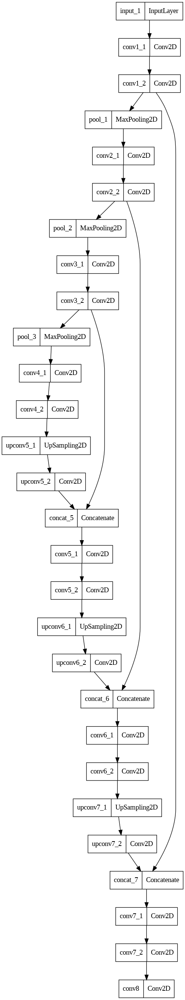

## 2.1. Создайте модель со следующей архитектурой:

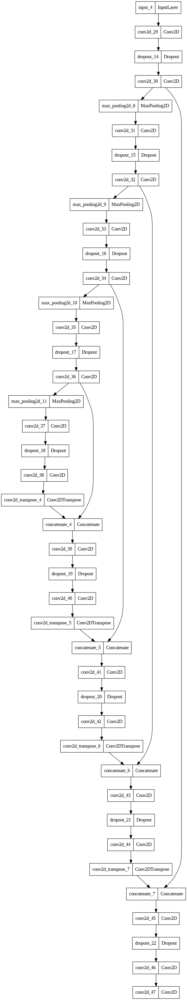

In [ ]:
model_2.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_29 (Conv2D)             (None, 256, 256, 16  448         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 dropout_14 (Dropout)           (None, 256, 256, 16  0           ['conv2d_29[0][0]']              
                                )                                                           

In [ ]:
model_2.get_config()

{'name': 'model_1',
 'trainable': True,
 'layers': [{'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, 256, 256, 3),
    'dtype': 'float32',
    'sparse': False,
    'ragged': False,
    'name': 'input_4'},
   'name': 'input_4',
   'inbound_nodes': []},
  {'class_name': 'Conv2D',
   'config': {'name': 'conv2d_29',
    'trainable': True,
    'dtype': 'float32',
    'filters': 16,
    'kernel_size': (3, 3),
    'strides': (1, 1),
    'padding': 'same',
    'data_format': 'channels_last',
    'dilation_rate': (1, 1),
    'groups': 1,
    'activation': 'relu',
    'use_bias': True,
    'kernel_initializer': {'class_name': 'HeNormal', 'config': {'seed': None}},
    'bias_initializer': {'class_name': 'Zeros', 'config': {}},
    'kernel_regularizer': None,
    'bias_regularizer': None,
    'activity_regularizer': None,
    'kernel_constraint': None,
    'bias_constraint': None},
   'name': 'conv2d_29',
   'inbound_nodes': [[['input_4', 0, 0, {}]]]},
  {'class_name': 'Dropo

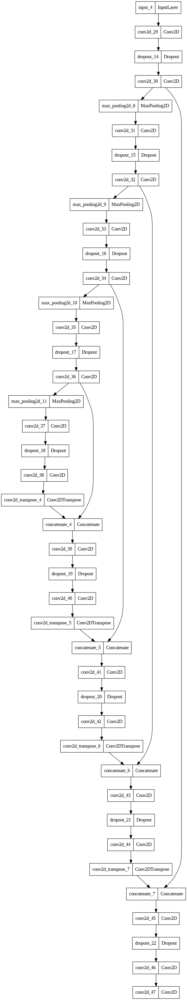

In [ ]:
plot_model(
model_2, to_file='model.png', show_shapes=False, show_dtype=False,
show_layer_names=True, rankdir='TB', expand_nested=False, dpi=96
)

### 2.1. Разработка архитектуры модели

In [ ]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose, Dropout, concatenate
from tensorflow.keras.models import Model

def model_2_builder(image_shape=(256, 256, 3), num_classes=5):
    inputs = Input(shape=image_shape)

    c1 = Conv2D(32, (3, 3), activation="relu", padding="same")(inputs)
    d1 = Dropout(0.1)(c1)
    c1 = Conv2D(32, (3, 3), activation="relu", padding="same")(d1)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = Conv2D(64, (3, 3), activation="relu", padding="same")(p1)
    d2 = Dropout(0.1)(c2)
    c2 = Conv2D(64, (3, 3), activation="relu", padding="same")(d2)
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = Conv2D(128, (3, 3), activation="relu", padding="same")(p2)
    d3 = Dropout(0.2)(c3)
    c3 = Conv2D(128, (3, 3), activation="relu", padding="same")(d3)
    p3 = MaxPooling2D((2, 2))(c3)

    c4 = Conv2D(256, (3, 3), activation="relu", padding="same")(p3)
    d4 = Dropout(0.2)(c4)
    c4 = Conv2D(256, (3, 3), activation="relu", padding="same")(d4)
    p4 = MaxPooling2D((2, 2))(c4)

    c5 = Conv2D(512, (3, 3), activation="relu", padding="same")(p4)
    d5 = Dropout(0.3)(c5)
    c5 = Conv2D(512, (3, 3), activation="relu", padding="same")(d5)

    u6 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding="same")(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(256, (3, 3), activation="relu", padding="same")(u6)
    d6 = Dropout(0.2)(c6)
    c6 = Conv2D(256, (3, 3), activation="relu", padding="same")(d6)

    u7 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding="same")(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(128, (3, 3), activation="relu", padding="same")(u7)
    d7 = Dropout(0.2)(c7)
    c7 = Conv2D(128, (3, 3), activation="relu", padding="same")(d7)

    u8 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding="same")(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(64, (3, 3), activation="relu", padding="same")(u8)
    d8 = Dropout(0.1)(c8)
    c8 = Conv2D(64, (3, 3), activation="relu", padding="same")(d8)

    u9 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding="same")(c8)
    u9 = concatenate([u9, c1])
    c9 = Conv2D(32, (3, 3), activation="relu", padding="same")(u9)
    d9 = Dropout(0.1)(c9)
    c9 = Conv2D(32, (3, 3), activation="relu", padding="same")(d9)

    outputs = Conv2D(num_classes, (1, 1), activation="softmax")(c9)

    return Model(inputs=inputs, outputs=outputs, name="model_2")

model_2 = model_2_builder(image_shape=(256, 256, 3), num_classes=n_classes)

I0000 00:00:1775062531.732942   18545 gpu_device.cc:2043] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 59351 MB memory:  -> device: 0, name: NVIDIA H100 PCIe, pci bus id: 0000:02:03.0, compute capability: 9.0a
E0000 00:00:1775062532.627058   18657 ptx_compiler_helpers.cc:154] *** WARNING *** Invoking ptxas with version 12.1.105, which corresponds to a CUDA version <=12.6.2. CUDA versions 12.x.y up to and including 12.6.2 miscompile certain edge cases around clamping.
Please upgrade to CUDA 12.6.3 or newer.


## 2.2. Обучите созданную модель для решения задачи семантической сегментации. В качестве функции потерь используйте ту, которая лучше всего показала себя в задании №1

### 2.2.1. Загрузите три снимка, а также маски, соответствующие этим снимкам

Загружены пары:
1. M-33-20-D-c-4-2_0_1.png | M-33-20-D-c-4-2_0_1.png | image shape=(256, 256, 3) | mask shape=(256, 256)
2. M-33-20-D-c-4-2_0_14.png | M-33-20-D-c-4-2_0_14.png | image shape=(256, 256, 3) | mask shape=(256, 256)
3. M-33-20-D-c-4-2_0_20.png | M-33-20-D-c-4-2_0_20.png | image shape=(256, 256, 3) | mask shape=(256, 256)


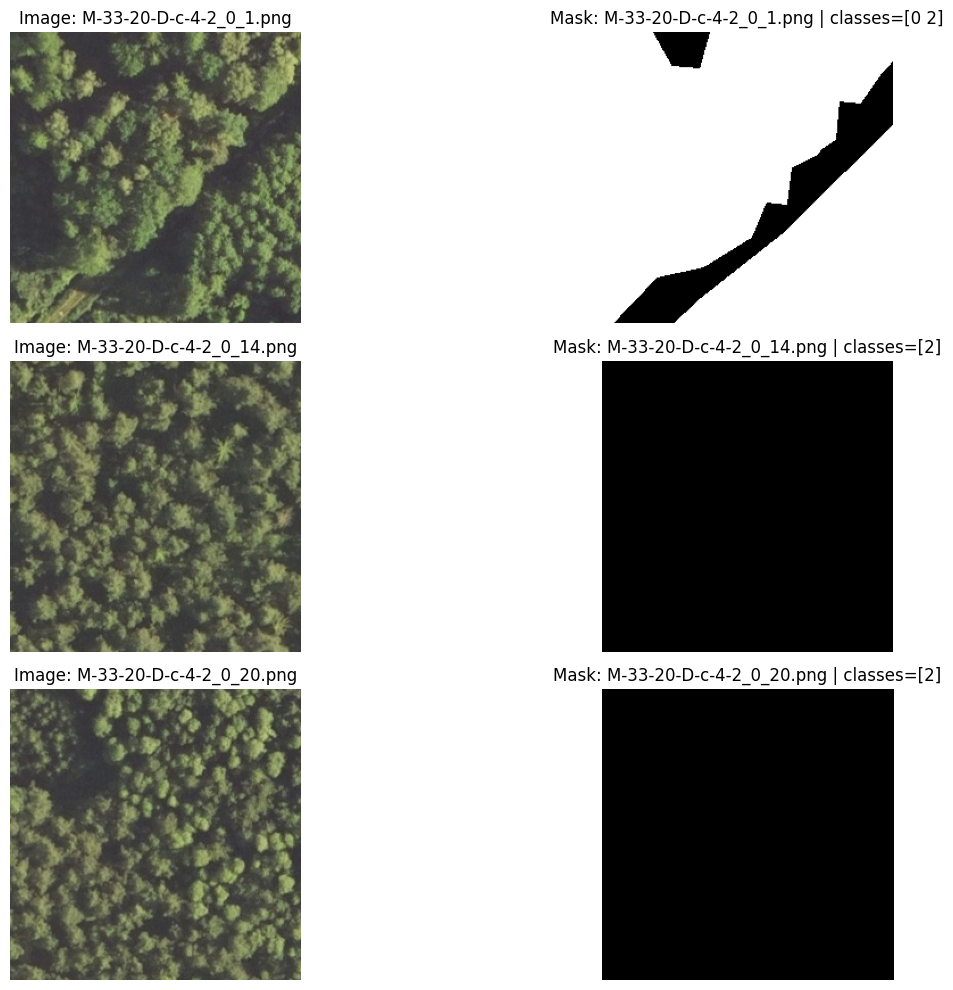

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Берем 3 полноразмерных снимка из validation-набора
sample_count = 3
sample_image_names = sorted(os.listdir(val_img_dir))[:sample_count]
sample_mask_names = sorted(os.listdir(val_mask_dir))[:sample_count]

sample_images = []
sample_masks = []
sample_pairs = []

for img_name, mask_name in zip(sample_image_names, sample_mask_names):
    img_path = os.path.join(val_img_dir, img_name)
    mask_path = os.path.join(val_mask_dir, mask_name)

    image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    sample_images.append(image)
    sample_masks.append(mask)
    sample_pairs.append((img_name, mask_name))

print("Загружены пары:")
for i, (img_name, mask_name) in enumerate(sample_pairs, 1):
    print(f"{i}. {img_name} | {mask_name} | image shape={sample_images[i-1].shape} | mask shape={sample_masks[i-1].shape}")

# Быстрая проверка
plt.figure(figsize=(15, 10))
for i in range(sample_count):
    plt.subplot(sample_count, 2, 2*i + 1)
    plt.imshow(sample_images[i])
    plt.title(f"Image: {sample_pairs[i][0]}")
    plt.axis("off")

    plt.subplot(sample_count, 2, 2*i + 2)
    plt.imshow(sample_masks[i], cmap="gray")
    plt.title(f"Mask: {sample_pairs[i][1]} | classes={np.unique(sample_masks[i])}")
    plt.axis("off")

plt.tight_layout()
plt.show()

### 2.2.2. Используя обученную модель, обработайте снимки по технологии, рассмотренной на практическом занятии (делим снимок на части, затем каждую часть обрабатываем нейросетью, а после соединяем все части для получения полноразмерной маски исходного снимка)

In [ ]:
best_loss = sm.losses.categorical_focal_jaccard_loss
metrics = ["accuracy", sm.metrics.iou_score]

model_2.compile(
    optimizer="Adam",
    loss=best_loss,
    metrics=metrics
)

# 3) заново создаем генераторы, чтобы не было проблем после предыдущих fit
train_gen_2 = multi_class_generator(train_generator, n_classes)
val_gen_2 = multi_class_generator(val_generator, n_classes)

# 4) шаги обучения
steps_per_epoch = math.ceil(969 / BATCH_SIZE)
validation_steps = math.ceil(243 / BATCH_SIZE)

# 5) callbacks
callbacks = [
    keras.callbacks.ModelCheckpoint(
        "best_model_2.keras",
        monitor="val_iou_score",
        mode="max",
        save_best_only=True,
        verbose=1
    ),
    keras.callbacks.EarlyStopping(
        monitor="val_iou_score",
        mode="max",
        patience=5,
        restore_best_weights=True,
        verbose=1
    )
]

# 6) обучение
history_model_2 = model_2.fit(
    train_gen_2,
    steps_per_epoch=steps_per_epoch,
    epochs=EPOCHS,
    validation_data=val_gen_2,
    validation_steps=validation_steps,
    callbacks=callbacks,
    verbose=1
)

Epoch 1/20
 3/61 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - accuracy: 0.2518 - iou_score: 0.0757 - loss: 0.9733  

I0000 00:00:1775064985.046286   18655 subprocess_compilation.cc:348] ptxas warning : Registers are spilled to local memory in function 'fusion_781', 492 bytes spill stores, 548 bytes spill loads



29/61 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.5603 - iou_score: 0.1129 - loss: 0.9233

E0000 00:00:1775064997.087515   18652 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


33/61 ━━━━━━━━━━━━━━━━━━━━ 23s 853ms/step - accuracy: 0.5746 - iou_score: 0.1150 - loss: 0.9206

I0000 00:00:1775065012.247694   18652 subprocess_compilation.cc:348] ptxas warning : Registers are spilled to local memory in function 'fusion_781', 492 bytes spill stores, 548 bytes spill loads



61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step - accuracy: 0.6268 - iou_score: 0.1230 - loss: 0.9098

E0000 00:00:1775065022.835220   18652 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.



Epoch 1: val_iou_score improved from None to 0.14017, saving model to best_model_2.keras
61/61 ━━━━━━━━━━━━━━━━━━━━ 69s 678ms/step - accuracy: 0.6958 - iou_score: 0.1340 - loss: 0.8944 - val_accuracy: 0.7146 - val_iou_score: 0.1402 - val_loss: 0.8859
Epoch 2/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.7439 - iou_score: 0.1465 - loss: 0.8792
Epoch 2: val_iou_score did not improve from 0.14017
61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - accuracy: 0.7357 - iou_score: 0.1510 - loss: 0.8750 - val_accuracy: 0.7479 - val_iou_score: 0.1323 - val_loss: 0.8864
Epoch 3/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - accuracy: 0.7340 - iou_score: 0.1786 - loss: 0.8500
Epoch 3: val_iou_score improved from 0.14017 to 0.24619, saving model to best_model_2.keras
61/61 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - accuracy: 0.7356 - iou_score: 0.1895 - loss: 0.8399 - val_accuracy: 0.7595 - val_iou_score: 0.2462 - val_loss: 0.7918
Epoch 4/20
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.7993 - io

### 2.2.3. Загрузите наиболее удачную модель из предыдущего задания (Задания №1). Сравните её точность с моделью, обученной в этом задании:

In [ ]:
import pandas as pd
from tensorflow.keras.metrics import MeanIoU

# Лучшая модель из задания 1
best_model_task1 = linknet_model

def predict_full_image_by_tiles(model, image, tile_size=256, num_classes=5):
    h, w = image.shape[:2]
    pred_mask = np.zeros((h, w), dtype=np.uint8)

    for y in range(0, h, tile_size):
        for x in range(0, w, tile_size):
            tile = image[y:y+tile_size, x:x+tile_size]
            tile_h, tile_w = tile.shape[:2]

            padded_tile = np.zeros((tile_size, tile_size, 3), dtype=np.uint8)
            padded_tile[:tile_h, :tile_w] = tile

            tile_input = padded_tile.astype(np.float32) / 255.0
            tile_input = np.expand_dims(tile_input, axis=0)

            tile_pred = model.predict(tile_input, verbose=0)
            tile_pred = np.argmax(tile_pred[0], axis=-1).astype(np.uint8)

            pred_mask[y:y+tile_h, x:x+tile_w] = tile_pred[:tile_h, :tile_w]

    return pred_mask

def calc_pixel_accuracy(y_true, y_pred):
    return np.mean(y_true == y_pred)

def calc_mean_iou(y_true, y_pred, num_classes):
    metric = MeanIoU(num_classes=num_classes)
    metric.update_state(y_true.reshape(-1), y_pred.reshape(-1))
    return float(metric.result().numpy())

comparison_rows = []

pred_masks_model_2 = []
pred_masks_best_model = []

for i, (image, true_mask) in enumerate(zip(sample_images, sample_masks), 1):
    pred_2 = predict_full_image_by_tiles(model_2, image, tile_size=256, num_classes=n_classes)
    pred_best = predict_full_image_by_tiles(best_model_task1, image, tile_size=256, num_classes=n_classes)

    pred_masks_model_2.append(pred_2)
    pred_masks_best_model.append(pred_best)

    acc_2 = calc_pixel_accuracy(true_mask, pred_2)
    iou_2 = calc_mean_iou(true_mask, pred_2, n_classes)

    acc_best = calc_pixel_accuracy(true_mask, pred_best)
    iou_best = calc_mean_iou(true_mask, pred_best, n_classes)

    comparison_rows.append({
        "image_id": i,
        "model_2_acc": round(acc_2, 4),
        "model_2_mIoU": round(iou_2, 4),
        "best_model_acc": round(acc_best, 4),
        "best_model_mIoU": round(iou_best, 4)
    })

comparison_df = pd.DataFrame(comparison_rows)
display(comparison_df)

print("Средние метрики:")
print(f"model_2      -> ACC: {comparison_df['model_2_acc'].mean():.4f}, mIoU: {comparison_df['model_2_mIoU'].mean():.4f}")
print(f"best_model_1 -> ACC: {comparison_df['best_model_acc'].mean():.4f}, mIoU: {comparison_df['best_model_mIoU'].mean():.4f}")

if comparison_df["model_2_mIoU"].mean() > comparison_df["best_model_mIoU"].mean():
    print("Лучшая модель на 3 полноразмерных снимках: model_2")
else:
    print("Лучшая модель на 3 полноразмерных снимках: linknet_model")

,image_id,model_2_acc,model_2_mIoU,best_model_acc,best_model_mIoU
0,1,0.8516,0.4258,0.8516,0.4258
1,2,1.0000,1.0000,1.0000,1.0000
2,3,1.0000,1.0000,1.0000,1.0000


Средние метрики:
model_2      -> ACC: 0.9505, mIoU: 0.8086
best_model_1 -> ACC: 0.9505, mIoU: 0.8086
Лучшая модель на 3 полноразмерных снимках: linknet_model


In [ ]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import load_model
from tensorflow.keras.metrics import MeanIoU
import segmentation_models as sm

# Загружаем лучшую модель из задания 1
best_model_task1 = load_model(
    "linknet_model.keras",
    custom_objects={
        "categorical_focal_jaccard_loss": sm.losses.categorical_focal_jaccard_loss,
        "iou_score": sm.metrics.iou_score
    },
    compile=False
)

best_model_task1.compile(
    optimizer="Adam",
    loss=sm.losses.categorical_focal_jaccard_loss,
    metrics=["accuracy", sm.metrics.iou_score]
)

def calc_pixel_accuracy(y_true, y_pred):
    return np.mean(y_true == y_pred)

def calc_mean_iou(y_true, y_pred, num_classes):
    metric = MeanIoU(num_classes=num_classes)
    metric.update_state(y_true.reshape(-1), y_pred.reshape(-1))
    return float(metric.result().numpy())

# 1) Сравнение на всей валидации по обычному evaluate
y_val_cat = tf.keras.utils.to_categorical(y_val, num_classes=n_classes).astype(np.float32)

loss_model_2, acc_model_2, iou_model_2 = model_2.evaluate(X_val_norm, y_val_cat, verbose=1)
loss_best, acc_best, iou_best = best_model_task1.evaluate(X_val_norm, y_val_cat, verbose=1)

# 2) Дополнительно считаем mean IoU по argmax-предсказаниям
pred_model_2 = np.argmax(model_2.predict(X_val_norm, verbose=1), axis=-1)
pred_best = np.argmax(best_model_task1.predict(X_val_norm, verbose=1), axis=-1)

pixel_acc_model_2 = calc_pixel_accuracy(y_val, pred_model_2)
pixel_acc_best = calc_pixel_accuracy(y_val, pred_best)

miou_model_2 = calc_mean_iou(y_val, pred_model_2, n_classes)
miou_best = calc_mean_iou(y_val, pred_best, n_classes)

comparison_df = pd.DataFrame([
    {
        "model": "model_2",
        "eval_loss": round(loss_model_2, 4),
        "eval_accuracy": round(acc_model_2, 4),
        "eval_iou_score": round(iou_model_2, 4),
        "pixel_accuracy": round(pixel_acc_model_2, 4),
        "mean_iou_argmax": round(miou_model_2, 4)
    },
    {
        "model": "linknet_model",
        "eval_loss": round(loss_best, 4),
        "eval_accuracy": round(acc_best, 4),
        "eval_iou_score": round(iou_best, 4),
        "pixel_accuracy": round(pixel_acc_best, 4),
        "mean_iou_argmax": round(miou_best, 4)
    }
])

display(comparison_df)

if miou_model_2 > miou_best:
    better_model_name = "model_2"
else:
    better_model_name = "linknet_model"

print(f"Лучшая модель по mean_iou_argmax на всей валидационной выборке: {better_model_name}")

5/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.9368 - iou_score: 0.3250 - loss: 0.6914

E0000 00:00:1775065315.533428   18654 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


8/8 ━━━━━━━━━━━━━━━━━━━━ 14s 931ms/step - accuracy: 0.9178 - iou_score: 0.3623 - loss: 0.6488
8/8 ━━━━━━━━━━━━━━━━━━━━ 7s 378ms/step - accuracy: 0.9358 - iou_score: 0.4314 - loss: 0.5735
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 4s 324ms/step


,model,eval_loss,eval_accuracy,eval_iou_score,pixel_accuracy,mean_iou_argmax
0,model_2,0.6488,0.9178,0.3623,0.9178,0.4721
1,linknet_model,0.5735,0.9358,0.4314,0.9358,0.5432


Лучшая модель по mean_iou_argmax на всей валидационной выборке: linknet_model


### 2.2.4. Отобразите предсказанную маску для каждого из трех снимков, загруженных ранее, в следующем формате: (исходный снимок, эталонная маска, предсказанная маска по модели, обученной в этом задании, предсказанная маска по модели, обученной в первом задании.

Выбраны более содержательные снимки:
1. M-33-20-D-c-4-2_24_14.png | M-33-20-D-c-4-2_24_14.png | classes=[0 2 3 4] | non_background_ratio=0.9806
2. M-33-20-D-c-4-2_35_9.png | M-33-20-D-c-4-2_35_9.png | classes=[0 2 3 4] | non_background_ratio=0.8547
3. M-33-20-D-c-4-2_33_6.png | M-33-20-D-c-4-2_33_6.png | classes=[0 2 3 4] | non_background_ratio=0.7314


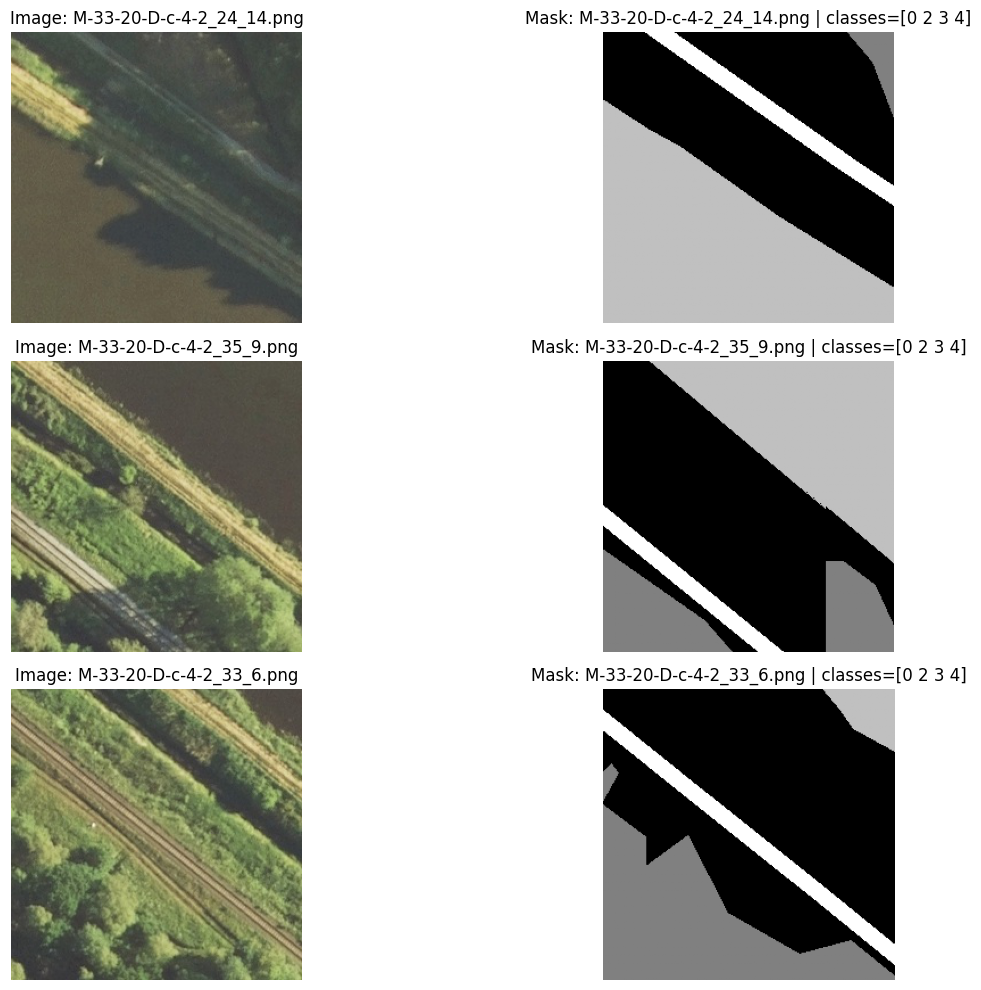

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

sample_count = 3
background_class = 2  # по твоим примерам основной фон = класс 2

all_image_names = sorted(os.listdir(val_img_dir))
all_mask_names = sorted(os.listdir(val_mask_dir))

candidates = []

for img_name, mask_name in zip(all_image_names, all_mask_names):
    img_path = os.path.join(val_img_dir, img_name)
    mask_path = os.path.join(val_mask_dir, mask_name)

    image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    unique_classes = np.unique(mask)
    non_background_ratio = np.mean(mask != background_class)
    num_classes = len(unique_classes)

    # чем больше классов и чем больше не-фона, тем интереснее пример
    score = num_classes * 10 + non_background_ratio

    candidates.append({
        "img_name": img_name,
        "mask_name": mask_name,
        "image": image,
        "mask": mask,
        "unique_classes": unique_classes,
        "non_background_ratio": non_background_ratio,
        "score": score
    })

# сортируем по "интересности"
candidates = sorted(
    candidates,
    key=lambda x: (len(x["unique_classes"]), x["non_background_ratio"]),
    reverse=True
)

selected = candidates[:sample_count]

sample_images = [x["image"] for x in selected]
sample_masks = [x["mask"] for x in selected]
sample_pairs = [(x["img_name"], x["mask_name"]) for x in selected]

print("Выбраны более содержательные снимки:")
for i, x in enumerate(selected, 1):
    print(
        f"{i}. {x['img_name']} | {x['mask_name']} | "
        f"classes={x['unique_classes']} | "
        f"non_background_ratio={x['non_background_ratio']:.4f}"
    )

plt.figure(figsize=(15, 10))
for i in range(sample_count):
    plt.subplot(sample_count, 2, 2 * i + 1)
    plt.imshow(sample_images[i])
    plt.title(f"Image: {sample_pairs[i][0]}")
    plt.axis("off")

    plt.subplot(sample_count, 2, 2 * i + 2)
    plt.imshow(sample_masks[i], cmap="gray")
    plt.title(f"Mask: {sample_pairs[i][1]} | classes={np.unique(sample_masks[i])}")
    plt.axis("off")

plt.tight_layout()
plt.show()

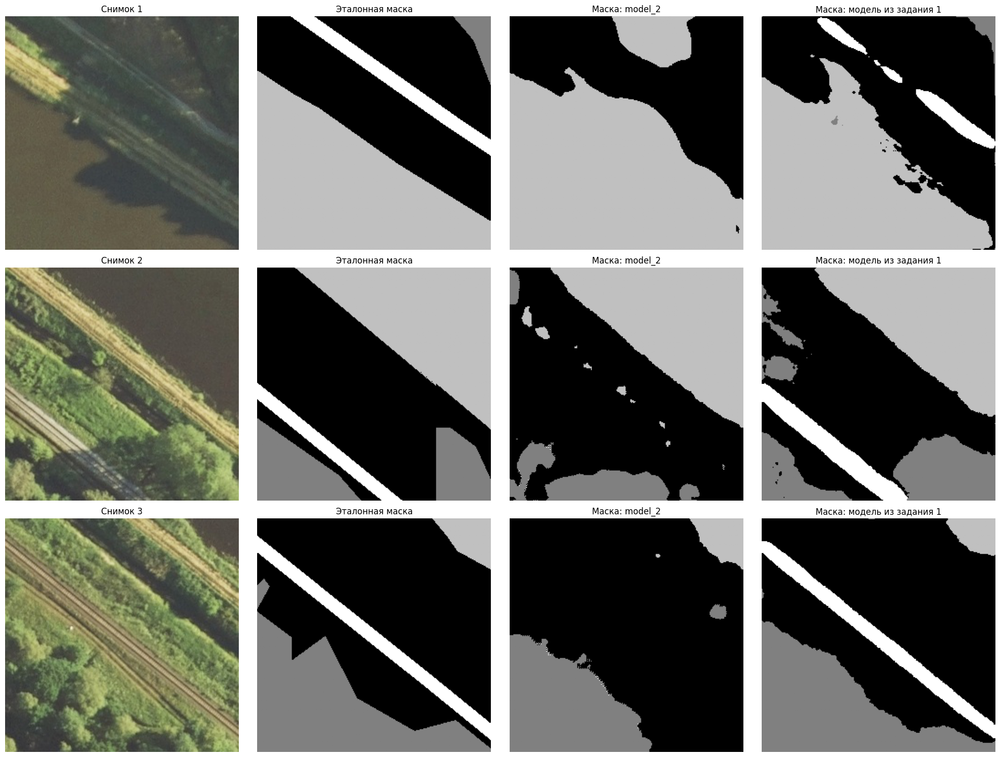

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Предсказания для 3 ранее загруженных снимков
pred_masks_model_2 = []
pred_masks_best_model = []

for image in sample_images:
    pred_2 = predict_full_image_by_tiles(model_2, image, tile_size=256, num_classes=n_classes)
    pred_best = predict_full_image_by_tiles(best_model_task1, image, tile_size=256, num_classes=n_classes)

    pred_masks_model_2.append(pred_2)
    pred_masks_best_model.append(pred_best)

# Визуализация:
# (исходный снимок, эталонная маска, pred model_2, pred model from task 1)
num_samples = len(sample_images)

plt.figure(figsize=(20, 5 * num_samples))

for i in range(num_samples):
    # 1. Исходный снимок
    plt.subplot(num_samples, 4, i * 4 + 1)
    plt.imshow(sample_images[i])
    plt.title(f"Снимок {i+1}")
    plt.axis("off")

    # 2. Эталонная маска
    plt.subplot(num_samples, 4, i * 4 + 2)
    plt.imshow(sample_masks[i], cmap="gray", vmin=0, vmax=n_classes-1)
    plt.title("Эталонная маска")
    plt.axis("off")

    # 3. Предсказание model_2
    plt.subplot(num_samples, 4, i * 4 + 3)
    plt.imshow(pred_masks_model_2[i], cmap="gray", vmin=0, vmax=n_classes-1)
    plt.title("Маска: model_2")
    plt.axis("off")

    # 4. Предсказание лучшей модели из задания 1
    plt.subplot(num_samples, 4, i * 4 + 4)
    plt.imshow(pred_masks_best_model[i], cmap="gray", vmin=0, vmax=n_classes-1)
    plt.title("Маска: модель из задания 1")
    plt.axis("off")

plt.tight_layout()
plt.show()


# Задание №3. Реализация готового решения для полноразмерной семантической сегментации спутникового снимка

## Реализуйте готовый алгоритм, который принимает на вход полноразмерное изображение и маску (опционально). После чего на его основе формирует полноразмерную маску, предсказанную наиболее удачной моделью нейронной сети, обученной ранее в Задании №1 или Задании №2.

In [ ]:
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.metrics import MeanIoU
import segmentation_models as sm

# ====== Константы ======
MODEL_PATH = "linknet_model.keras"   # лучшая модель из задания №1
PATCH_SIZE = 256
N_CLASSES = 5

# Палитра классов из теории (5 классов)
CLASS_COLORS = np.array([
    [60, 16, 152],    # 0 - building
    [132, 41, 246],   # 1 - land
    [110, 193, 228],  # 2 - road
    [254, 221, 58],   # 3 - vegetation
    [226, 169, 41],   # 4 - water
], dtype=np.uint8)

# ====== Загрузка модели ======
best_model = load_model(
    MODEL_PATH,
    custom_objects={
        "categorical_focal_jaccard_loss": sm.losses.categorical_focal_jaccard_loss,
        "iou_score": sm.metrics.iou_score
    },
    compile=False
)

best_model.compile(
    optimizer="Adam",
    loss=sm.losses.categorical_focal_jaccard_loss,
    metrics=["accuracy", sm.metrics.iou_score]
)

# ====== Вспомогательные функции ======
def label_to_rgb(mask_2d: np.ndarray) -> np.ndarray:
    mask_2d = mask_2d.astype(np.uint8)
    return CLASS_COLORS[mask_2d]

def predict_full_image_by_tiles(model, image_rgb: np.ndarray, tile_size: int = 256) -> np.ndarray:
    h, w = image_rgb.shape[:2]

    pad_h = (tile_size - h % tile_size) % tile_size
    pad_w = (tile_size - w % tile_size) % tile_size

    padded = cv2.copyMakeBorder(
        image_rgb, 0, pad_h, 0, pad_w,
        borderType=cv2.BORDER_REFLECT_101
    )

    ph, pw = padded.shape[:2]
    pred_mask = np.zeros((ph, pw), dtype=np.uint8)

    for y in range(0, ph, tile_size):
        for x in range(0, pw, tile_size):
            tile = padded[y:y+tile_size, x:x+tile_size]
            tile_input = tile.astype(np.float32) / 255.0
            tile_input = np.expand_dims(tile_input, axis=0)

            pred = model.predict(tile_input, verbose=0)
            pred = np.argmax(pred[0], axis=-1).astype(np.uint8)

            pred_mask[y:y+tile_size, x:x+tile_size] = pred

    return pred_mask[:h, :w]

def calc_pixel_accuracy(y_true: np.ndarray, y_pred: np.ndarray) -> float:
    return float(np.mean(y_true == y_pred))

def calc_mean_iou(y_true: np.ndarray, y_pred: np.ndarray, num_classes: int = 5) -> float:
    metric = MeanIoU(num_classes=num_classes)
    metric.update_state(y_true.reshape(-1), y_pred.reshape(-1))
    return float(metric.result().numpy())

def run_full_segmentation(image_path: str, mask_path: str = None, save_name: str = "predicted_mask.png"):
    image_bgr = cv2.imread(image_path)
    if image_bgr is None:
        raise FileNotFoundError(f"Не удалось загрузить изображение: {image_path}")

    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    pred_mask = predict_full_image_by_tiles(best_model, image_rgb, tile_size=PATCH_SIZE)
    pred_mask_rgb = label_to_rgb(pred_mask)

    cv2.imwrite(save_name, cv2.cvtColor(pred_mask_rgb, cv2.COLOR_RGB2BGR))
    print(f"Предсказанная маска сохранена: {save_name}")

    plt.figure(figsize=(18, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(image_rgb)
    plt.title("Исходный снимок")
    plt.axis("off")

    if mask_path is not None:
        true_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if true_mask is None:
            raise FileNotFoundError(f"Не удалось загрузить маску: {mask_path}")

        plt.subplot(1, 3, 2)
        plt.imshow(label_to_rgb(true_mask))
        plt.title("Эталонная маска")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(pred_mask_rgb)
        plt.title("Предсказанная маска")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

        pixel_acc = calc_pixel_accuracy(true_mask, pred_mask)
        mean_iou = calc_mean_iou(true_mask, pred_mask, num_classes=N_CLASSES)

        print(f"Pixel Accuracy: {pixel_acc:.4f}")
        print(f"Mean IoU: {mean_iou:.4f}")

        return pred_mask, pred_mask_rgb, true_mask
    else:
        plt.subplot(1, 3, 2)
        plt.imshow(pred_mask_rgb)
        plt.title("Предсказанная маска")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

        return pred_mask, pred_mask_rgb

Segmentation Models: using `tf.keras` framework.


- Сравните получившийся результат с эталонной маской

[ WARN:0@43664.168] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 33550 (0x830e) encountered
[ WARN:0@43664.168] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 33918 (0x847e) encountered
[ WARN:0@43664.168] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 33922 (0x8482) encountered
[ WARN:0@43664.168] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 34735 (0x87af) encountered
[ WARN:0@43664.168] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 34736 (0x87b0) encountered
[ WARN:0@43664.168] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 34737 (0x87b1) encountered


Предсказанная маска сохранена: predicted_mask_from_full_image.png


[ WARN:0@43743.385] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 33550 (0x830e) encountered
[ WARN:0@43743.385] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 33922 (0x8482) encountered
[ WARN:0@43743.385] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 34735 (0x87af) encountered
[ WARN:0@43743.385] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 34736 (0x87b0) encountered
[ WARN:0@43743.385] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 34737 (0x87b1) encountered


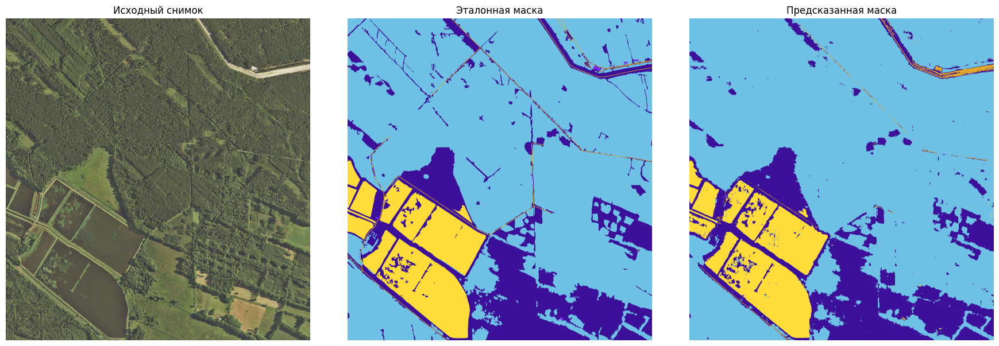

Pixel Accuracy: 0.9461
Mean IoU: 0.5788


[ WARN:0@43755.110] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 33550 (0x830e) encountered
[ WARN:0@43755.110] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 33918 (0x847e) encountered
[ WARN:0@43755.110] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 33922 (0x8482) encountered
[ WARN:0@43755.110] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 34735 (0x87af) encountered
[ WARN:0@43755.110] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 34736 (0x87b0) encountered
[ WARN:0@43755.110] global grfmt_tiff.cpp:122 TIFF_Warning TIFFReadDirectory: Unknown field with tag 34737 (0x87b1) encountered


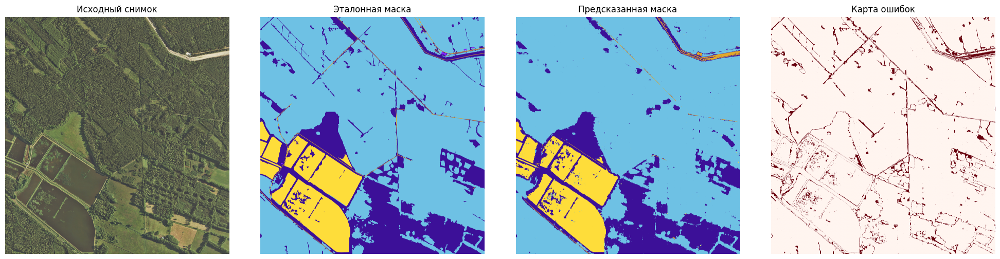

Уникальные классы в эталоне: [0 1 2 3 4]
Уникальные классы в предсказании: [0 2 3 4]
Pixel Accuracy: 0.9461
Mean IoU: 0.5788


In [ ]:
# Сравнение получившегося результата с эталонной маской

image_path = "./landcover.ai.v1/images/" + sorted(os.listdir("./landcover.ai.v1/images"))[0]
mask_path  = "./landcover.ai.v1/masks/"  + sorted(os.listdir("./landcover.ai.v1/masks"))[0]

pred_mask, pred_mask_rgb, true_mask = run_full_segmentation(
    image_path=image_path,
    mask_path=mask_path,
    save_name="predicted_mask_from_full_image.png"
)

# Дополнительная визуализация ошибки
diff_map = (pred_mask != true_mask).astype(np.uint8)

plt.figure(figsize=(20, 5))

plt.subplot(1, 4, 1)
img_rgb = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.title("Исходный снимок")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(label_to_rgb(true_mask))
plt.title("Эталонная маска")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(pred_mask_rgb)
plt.title("Предсказанная маска")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(diff_map, cmap="Reds")
plt.title("Карта ошибок")
plt.axis("off")

plt.tight_layout()
plt.show()

print("Уникальные классы в эталоне:", np.unique(true_mask))
print("Уникальные классы в предсказании:", np.unique(pred_mask))
print(f"Pixel Accuracy: {calc_pixel_accuracy(true_mask, pred_mask):.4f}")
print(f"Mean IoU: {calc_mean_iou(true_mask, pred_mask, num_classes=N_CLASSES):.4f}")

- Реализуйте графический интерфейс с помощью Gradio. На вход подается только исходный растр - на выходе отображается сгенерированная маска. Также маска автоматически должна сохраняться в корневом каталоге.

In [ ]:
import gradio as gr
from PIL import Image
import os

# ====== Подготовка examples ======
test_images_dir = "./landcover.ai.v1/images"
example_images = sorted(os.listdir(test_images_dir))[:5]  # берем 5 примеров

examples = [[os.path.join(test_images_dir, img)] for img in example_images]

# ====== Gradio функция ======
def predict_mask_gradio(input_image):
    if input_image is None:
        return None

    if isinstance(input_image, Image.Image):
        image_rgb = np.array(input_image.convert("RGB"))
    else:
        image_rgb = np.array(input_image)

    pred_mask = predict_full_image_by_tiles(best_model, image_rgb, tile_size=PATCH_SIZE)
    pred_mask_rgb = label_to_rgb(pred_mask)

    save_path = "gradio_predicted_mask.png"
    cv2.imwrite(save_path, cv2.cvtColor(pred_mask_rgb, cv2.COLOR_RGB2BGR))

    return pred_mask_rgb

# ====== Интерфейс ======
demo = gr.Interface(
    fn=predict_mask_gradio,
    inputs=gr.Image(type="pil", label="Исходный растр"),
    outputs=gr.Image(type="numpy", label="Сгенерированная маска"),
    examples=examples,
    title="Семантическая сегментация спутникового снимка",
    description="Примеры загружены из тестовой выборки landcover.ai.v1"
)

demo.launch(share=False, debug=True)

* Running on local URL:  http://127.0.0.1:7860
* To create a public link, set `share=True` in `launch()`.
